<a href="https://colab.research.google.com/github/steineggerlab/colabfold-protocol/blob/main/ASCT2_conformation_dropout.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://raw.githubusercontent.com/sokrypton/ColabFold/main/.github/ColabFold_Marv_Logo_Small.png" height="200" align="right" style="height:240px">

##ColabFold v1.5.3: AlphaFold2 using MMseqs2

Easy to use protein structure and complex prediction using [AlphaFold2](https://www.nature.com/articles/s41586-021-03819-2) and [Alphafold2-multimer](https://www.biorxiv.org/content/10.1101/2021.10.04.463034v1). Sequence alignments/templates are generated through [MMseqs2](mmseqs.com) and [HHsearch](https://github.com/soedinglab/hh-suite). For more details, see <a href="#Instructions">bottom</a> of the notebook, checkout the [ColabFold GitHub](https://github.com/sokrypton/ColabFold) and read our manuscript.
Old versions: [v1.4](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.4.0/AlphaFold2.ipynb), [v1.5.1](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.5.1/AlphaFold2.ipynb), [v1.5.2](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.5.2/AlphaFold2.ipynb)

[Mirdita M, Schütze K, Moriwaki Y, Heo L, Ovchinnikov S, Steinegger M. ColabFold: Making protein folding accessible to all.
*Nature Methods*, 2022](https://www.nature.com/articles/s41592-022-01488-1)

-----------

### News
- <b><font color='green'>2023/07/31: The ColabFold MSA server is back to normal. It was using older DB (UniRef30 2202/PDB70 220313) from 27th ~8:30 AM CEST to 31st ~11:10 AM CEST.</font></b>
- <b><font color='green'>2023/06/12: New databases! UniRef30 updated to 2023_02 and PDB to 230517. We now use PDB100 instead of PDB70 (see [notes](#pdb100)).</font></b>
- <b><font color='green'>2023/06/12: We introduced a new default pairing strategy: Previously, for multimer predictions with more than 2 chains, we only pair if all sequences taxonomically match ("complete" pairing). The new default "greedy" strategy pairs any taxonomically matching subsets.</font></b>

In [ ]:
#@title Input protein sequence(s), then hit `Runtime` -> `Run all`
from google.colab import files
import os
import re
import hashlib
import random

from sys import version_info
python_version = f"{version_info.major}.{version_info.minor}"

def add_hash(x,y):
  return x+"_"+hashlib.sha1(y.encode()).hexdigest()[:5]

query_sequence = 'MVADPPRDSKGLAAAEPTANGGLALASIEDQGAAAGGYCGSRDQVRRCLRANLLVLLTVVAVVAGVALGLGVSGAGGALALGPERLSAFVFPGELLLRLLRMIILPLVVCSLIGGAASLDPGALGRLGAWALLFFLVTTLLASALGVGLALALQPGAASAAINASVGAAGSAENAPSKEVLDSFLDLARNIFPSNLVSAAFRSYSTTYEERNITGTRVKVPVGQEVEGMNILGLVVFAIVFGVALRKLGPEGELLIRFFNSFNEATMVLVSWIMWYAPVGIMFLVAGKIVEMEDVGLLFARLGKYILCCLLGHAIHGLLVLPLIYFLFTRKNPYRFLWGIVTPLATAFGTSSSSATLPLMMKCVEENNGVAKHISRFILPIGATVNMDGAALFQCVAAVFIAQLSQQSLDFVKIITILVTATASSVGAAGIPAGGVLTLAIILEAVNLPVDHISLILAVDWLVDRSCTVLNVEGDALGAGLLQNYVDRTESRSTEPELIQVKSELPLDPLPVPTEEGNPLLKHYRGPAGDATVASEKESVM' #@param {type:"string"}
#@markdown  - Use `:` to specify inter-protein chainbreaks for **modeling complexes** (supports homo- and hetro-oligomers). For example **PI...SK:PI...SK** for a homodimer
jobname = 'Dropout_ASCT2(PDB : 7BCQa)' #@param {type:"string"}
# number of models to use
num_relax = 0 #@param [0, 1, 5] {type:"raw"}
#@markdown - specify how many of the top ranked structures to relax using amber
template_mode = "none" #@param ["none", "pdb100","custom"]
#@markdown - `none` = no template information is used. `pdb100` = detect templates in pdb100 (see [notes](#pdb100)). `custom` - upload and search own templates (PDB or mmCIF format, see [notes](#custom_templates))

use_amber = num_relax > 0

# remove whitespaces
query_sequence = "".join(query_sequence.split())

basejobname = "".join(jobname.split())
basejobname = re.sub(r'\W+', '', basejobname)
jobname = add_hash(basejobname, query_sequence)

# check if directory with jobname exists
def check(folder):
  if os.path.exists(folder):
    return False
  else:
    return True
if not check(jobname):
  n = 0
  while not check(f"{jobname}_{n}"): n += 1
  jobname = f"{jobname}_{n}"

# make directory to save results
os.makedirs(jobname, exist_ok=True)

# save queries
queries_path = os.path.join(jobname, f"{jobname}.csv")
with open(queries_path, "w") as text_file:
  text_file.write(f"id,sequence\n{jobname},{query_sequence}")

if template_mode == "pdb100":
  use_templates = True
  custom_template_path = None
elif template_mode == "custom":
  custom_template_path = os.path.join(jobname,f"template")
  os.makedirs(custom_template_path, exist_ok=True)
  uploaded = files.upload()
  use_templates = True
  for fn in uploaded.keys():
    os.rename(fn,os.path.join(custom_template_path,fn))
else:
  custom_template_path = None
  use_templates = False

print("jobname",jobname)
print("sequence",query_sequence)
print("length",len(query_sequence.replace(":","")))



jobname Dropout_ASCT2PDB7BCQa_9e487
sequence MVADPPRDSKGLAAAEPTANGGLALASIEDQGAAAGGYCGSRDQVRRCLRANLLVLLTVVAVVAGVALGLGVSGAGGALALGPERLSAFVFPGELLLRLLRMIILPLVVCSLIGGAASLDPGALGRLGAWALLFFLVTTLLASALGVGLALALQPGAASAAINASVGAAGSAENAPSKEVLDSFLDLARNIFPSNLVSAAFRSYSTTYEERNITGTRVKVPVGQEVEGMNILGLVVFAIVFGVALRKLGPEGELLIRFFNSFNEATMVLVSWIMWYAPVGIMFLVAGKIVEMEDVGLLFARLGKYILCCLLGHAIHGLLVLPLIYFLFTRKNPYRFLWGIVTPLATAFGTSSSSATLPLMMKCVEENNGVAKHISRFILPIGATVNMDGAALFQCVAAVFIAQLSQQSLDFVKIITILVTATASSVGAAGIPAGGVLTLAIILEAVNLPVDHISLILAVDWLVDRSCTVLNVEGDALGAGLLQNYVDRTESRSTEPELIQVKSELPLDPLPVPTEEGNPLLKHYRGPAGDATVASEKESVM
length 541


In [ ]:
#@title Install dependencies
%%time
import os
USE_AMBER = use_amber
USE_TEMPLATES = use_templates
PYTHON_VERSION = python_version

if not os.path.isfile("COLABFOLD_READY"):
  print("installing colabfold...")
  os.system("pip install -q --no-warn-conflicts 'colabfold[alphafold-minus-jax] @ git+https://github.com/sokrypton/ColabFold'")
  os.system("pip install --upgrade dm-haiku")
  os.system("ln -s /usr/local/lib/python3.*/dist-packages/colabfold colabfold")
  os.system("ln -s /usr/local/lib/python3.*/dist-packages/alphafold alphafold")
  # patch for jax > 0.3.25
  os.system("sed -i 's/weights = jax.nn.softmax(logits)/logits=jnp.clip(logits,-1e8,1e8);weights=jax.nn.softmax(logits)/g' alphafold/model/modules.py")
  os.system("touch COLABFOLD_READY")

if USE_AMBER or USE_TEMPLATES:
  if not os.path.isfile("CONDA_READY"):
    print("installing conda...")
    os.system("wget -qnc https://github.com/conda-forge/miniforge/releases/latest/download/Mambaforge-Linux-x86_64.sh")
    os.system("bash Mambaforge-Linux-x86_64.sh -bfp /usr/local")
    os.system("mamba config --set auto_update_conda false")
    os.system("touch CONDA_READY")

if USE_TEMPLATES and not os.path.isfile("HH_READY") and USE_AMBER and not os.path.isfile("AMBER_READY"):
  print("installing hhsuite and amber...")
  os.system(f"mamba install -y -c conda-forge -c bioconda kalign2=2.04 hhsuite=3.3.0 openmm=7.7.0 python='{PYTHON_VERSION}' pdbfixer")
  os.system("touch HH_READY")
  os.system("touch AMBER_READY")
else:
  if USE_TEMPLATES and not os.path.isfile("HH_READY"):
    print("installing hhsuite...")
    os.system(f"mamba install -y -c conda-forge -c bioconda kalign2=2.04 hhsuite=3.3.0 python='{PYTHON_VERSION}'")
    os.system("touch HH_READY")
  if USE_AMBER and not os.path.isfile("AMBER_READY"):
    print("installing amber...")
    os.system(f"mamba install -y -c conda-forge openmm=7.7.0 python='{PYTHON_VERSION}' pdbfixer")
    os.system("touch AMBER_READY")

installing colabfold...
CPU times: user 102 ms, sys: 19.5 ms, total: 121 ms
Wall time: 33 s


In [ ]:
#@markdown ### MSA options (custom MSA upload, single sequence, pairing mode)
msa_mode = "mmseqs2_uniref_env" #@param ["mmseqs2_uniref_env", "mmseqs2_uniref","single_sequence","custom"]
pair_mode = "unpaired_paired" #@param ["unpaired_paired","paired","unpaired"] {type:"string"}
#@markdown - "unpaired_paired" = pair sequences from same species + unpaired MSA, "unpaired" = seperate MSA for each chain, "paired" - only use paired sequences.

# decide which a3m to use
if "mmseqs2" in msa_mode:
  a3m_file = os.path.join(jobname,f"{jobname}.a3m")

elif msa_mode == "custom":
  a3m_file = os.path.join(jobname,f"{jobname}.custom.a3m")
  if not os.path.isfile(a3m_file):
    custom_msa_dict = files.upload()
    custom_msa = list(custom_msa_dict.keys())[0]
    header = 0
    import fileinput
    for line in fileinput.FileInput(custom_msa,inplace=1):
      if line.startswith(">"):
         header = header + 1
      if not line.rstrip():
        continue
      if line.startswith(">") == False and header == 1:
         query_sequence = line.rstrip()
      print(line, end='')

    os.rename(custom_msa, a3m_file)
    queries_path=a3m_file
    print(f"moving {custom_msa} to {a3m_file}")

else:
  a3m_file = os.path.join(jobname,f"{jobname}.single_sequence.a3m")
  with open(a3m_file, "w") as text_file:
    text_file.write(">1\n%s" % query_sequence)

In [ ]:
#@markdown ### Advanced settings
model_type = "auto" #@param ["auto", "alphafold2_ptm", "alphafold2_multimer_v1", "alphafold2_multimer_v2", "alphafold2_multimer_v3"]
#@markdown - if `auto` selected, will use `alphafold2_ptm` for monomer prediction and `alphafold2_multimer_v3` for complex prediction.
#@markdown Any of the mode_types can be used (regardless if input is monomer or complex).
num_recycles = "3" #@param ["auto", "0", "1", "3", "6", "12", "24", "48"]
#@markdown - if `auto` selected, will use `num_recycles=20` if `model_type=alphafold2_multimer_v3`, else `num_recycles=3` .
recycle_early_stop_tolerance = "auto" #@param ["auto", "0.0", "0.5", "1.0"]
#@markdown - if `auto` selected, will use `tol=0.5` if `model_type=alphafold2_multimer_v3` else `tol=0.0`.
relax_max_iterations = 200 #@param [0, 200, 2000] {type:"raw"}
#@markdown - max amber relax iterations, `0` = unlimited (AlphaFold2 default, can take very long)
pairing_strategy = "greedy" #@param ["greedy", "complete"] {type:"string"}
#@markdown - `greedy` = pair any taxonomically matching subsets, `complete` = all sequences have to match in one line.


#@markdown #### Sample settings
#@markdown -  enable dropouts and increase number of seeds to sample predictions from uncertainty of the model.
#@markdown -  decrease `max_msa` to increase uncertainity
max_msa = "auto" #@param ["auto", "512:1024", "256:512", "64:128", "32:64", "16:32"]
num_seeds = 16 #@param [1,2,4,8,16] {type:"raw"}
use_dropout = True #@param {type:"boolean"}

num_recycles = None if num_recycles == "auto" else int(num_recycles)
recycle_early_stop_tolerance = None if recycle_early_stop_tolerance == "auto" else float(recycle_early_stop_tolerance)
if max_msa == "auto": max_msa = None

#@markdown #### Save settings
save_all = False #@param {type:"boolean"}
save_recycles = False #@param {type:"boolean"}
save_to_google_drive = False #@param {type:"boolean"}
#@markdown -  if the save_to_google_drive option was selected, the result zip will be uploaded to your Google Drive
dpi = 200 #@param {type:"integer"}
#@markdown - set dpi for image resolution

if save_to_google_drive:
  from pydrive.drive import GoogleDrive
  from pydrive.auth import GoogleAuth
  from google.colab import auth
  from oauth2client.client import GoogleCredentials
  auth.authenticate_user()
  gauth = GoogleAuth()
  gauth.credentials = GoogleCredentials.get_application_default()
  drive = GoogleDrive(gauth)
  print("You are logged into Google Drive and are good to go!")

#@markdown Don't forget to hit `Runtime` -> `Run all` after updating the form.

2023-11-09 06:25:02,367 Unable to initialize backend 'rocm': NOT_FOUND: Could not find registered platform with name: "rocm". Available platform names are: CUDA
2023-11-09 06:25:02,368 Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
2023-11-09 06:25:04,762 Running on GPU
2023-11-09 06:25:04,864 Found 4 citations for tools or databases
2023-11-09 06:25:04,865 Query 1/1: Dropout_ASCT2PDB7BCQa_9e487 (length 541)


COMPLETE: 100%|██████████| 150/150 [elapsed: 00:02 remaining: 00:00]


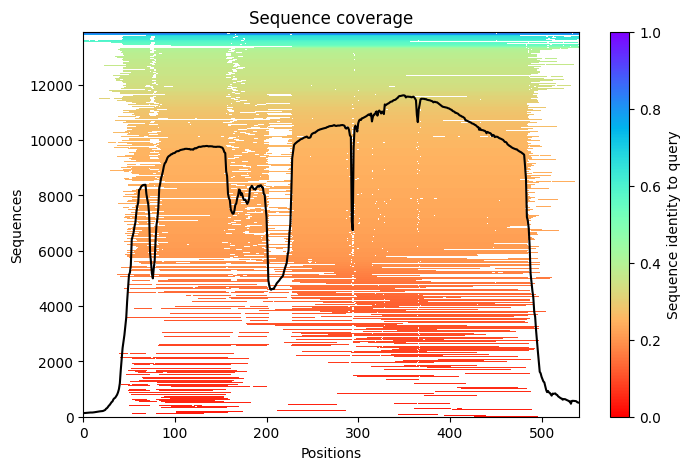

2023-11-09 06:25:11,499 Setting max_seq=512, max_extra_seq=5120
2023-11-09 06:26:24,134 alphafold2_ptm_model_1_seed_000 recycle=0 pLDDT=70.9 pTM=0.647
2023-11-09 06:26:34,086 alphafold2_ptm_model_1_seed_000 recycle=1 pLDDT=70.9 pTM=0.644 tol=4.01
2023-11-09 06:26:44,089 alphafold2_ptm_model_1_seed_000 recycle=2 pLDDT=71.1 pTM=0.634 tol=3.43
2023-11-09 06:26:54,036 alphafold2_ptm_model_1_seed_000 recycle=3 pLDDT=74.7 pTM=0.712 tol=3.51
2023-11-09 06:26:54,037 alphafold2_ptm_model_1_seed_000 took 81.7s (3 recycles)


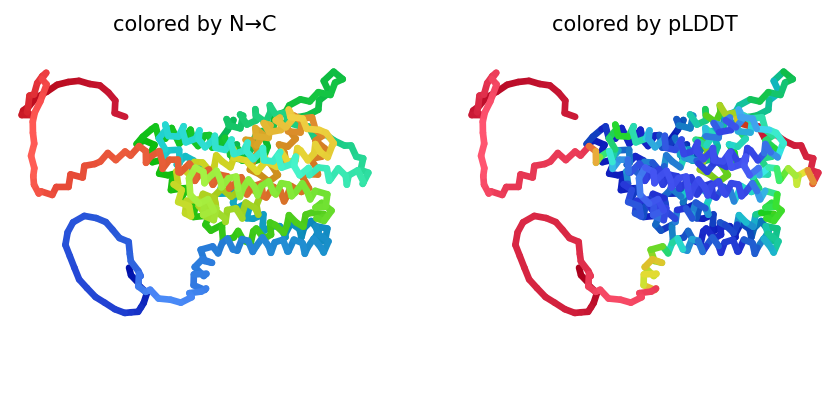

2023-11-09 06:27:04,688 alphafold2_ptm_model_2_seed_000 recycle=0 pLDDT=71.2 pTM=0.64
2023-11-09 06:27:14,675 alphafold2_ptm_model_2_seed_000 recycle=1 pLDDT=74 pTM=0.703 tol=6.09
2023-11-09 06:27:24,731 alphafold2_ptm_model_2_seed_000 recycle=2 pLDDT=76.2 pTM=0.746 tol=2.49
2023-11-09 06:27:34,715 alphafold2_ptm_model_2_seed_000 recycle=3 pLDDT=75.7 pTM=0.739 tol=1.8
2023-11-09 06:27:34,716 alphafold2_ptm_model_2_seed_000 took 40.1s (3 recycles)


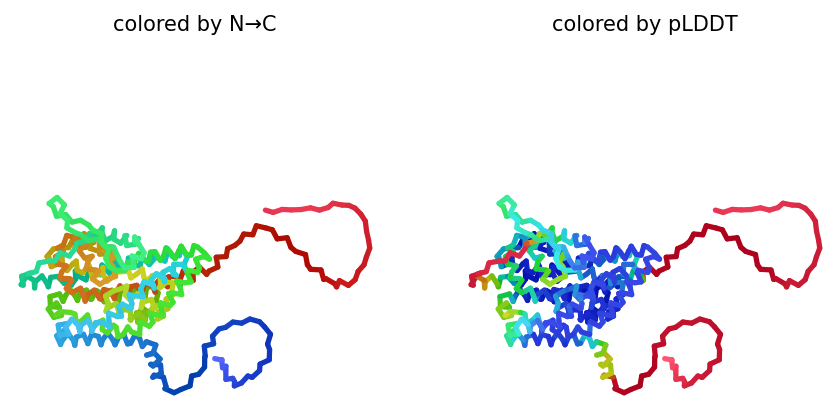

2023-11-09 06:27:45,367 alphafold2_ptm_model_3_seed_000 recycle=0 pLDDT=76.2 pTM=0.743
2023-11-09 06:27:55,393 alphafold2_ptm_model_3_seed_000 recycle=1 pLDDT=77.7 pTM=0.765 tol=2.98
2023-11-09 06:28:05,475 alphafold2_ptm_model_3_seed_000 recycle=2 pLDDT=77.9 pTM=0.771 tol=1.86
2023-11-09 06:28:15,511 alphafold2_ptm_model_3_seed_000 recycle=3 pLDDT=77.8 pTM=0.771 tol=0.899
2023-11-09 06:28:15,512 alphafold2_ptm_model_3_seed_000 took 40.2s (3 recycles)


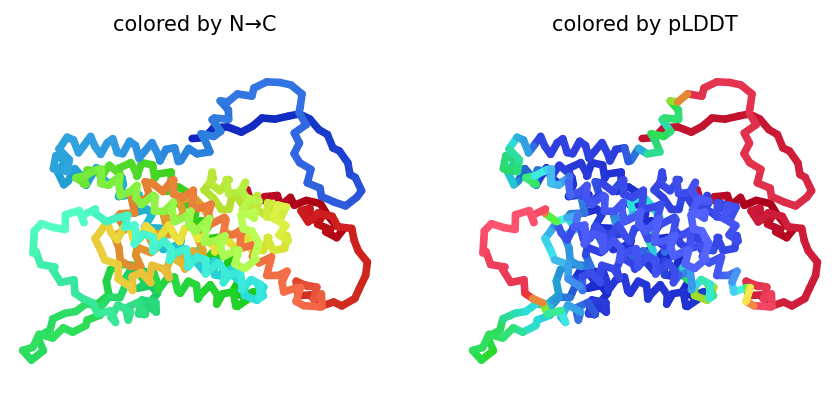

2023-11-09 06:28:26,143 alphafold2_ptm_model_4_seed_000 recycle=0 pLDDT=73.2 pTM=0.707
2023-11-09 06:28:36,128 alphafold2_ptm_model_4_seed_000 recycle=1 pLDDT=74.8 pTM=0.744 tol=2.77
2023-11-09 06:28:46,167 alphafold2_ptm_model_4_seed_000 recycle=2 pLDDT=75.2 pTM=0.744 tol=2.01
2023-11-09 06:28:56,153 alphafold2_ptm_model_4_seed_000 recycle=3 pLDDT=75.1 pTM=0.742 tol=1.72
2023-11-09 06:28:56,154 alphafold2_ptm_model_4_seed_000 took 40.0s (3 recycles)


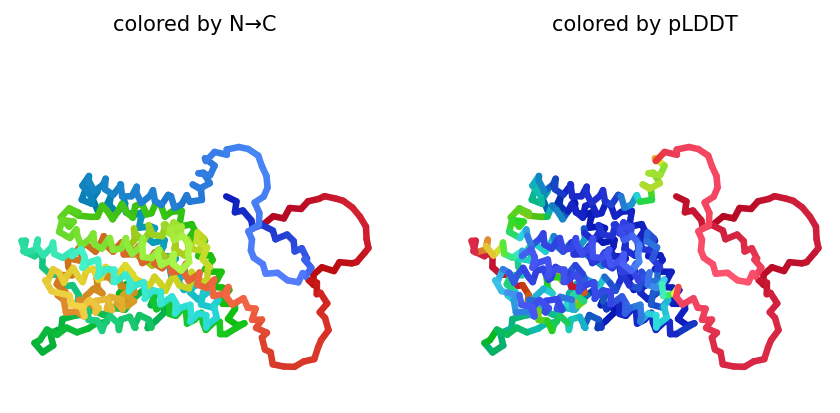

2023-11-09 06:29:06,794 alphafold2_ptm_model_5_seed_000 recycle=0 pLDDT=73.6 pTM=0.721
2023-11-09 06:29:16,867 alphafold2_ptm_model_5_seed_000 recycle=1 pLDDT=77.9 pTM=0.772 tol=3.21
2023-11-09 06:29:26,979 alphafold2_ptm_model_5_seed_000 recycle=2 pLDDT=77.4 pTM=0.767 tol=3.75
2023-11-09 06:29:37,024 alphafold2_ptm_model_5_seed_000 recycle=3 pLDDT=77 pTM=0.761 tol=2.67
2023-11-09 06:29:37,025 alphafold2_ptm_model_5_seed_000 took 40.3s (3 recycles)


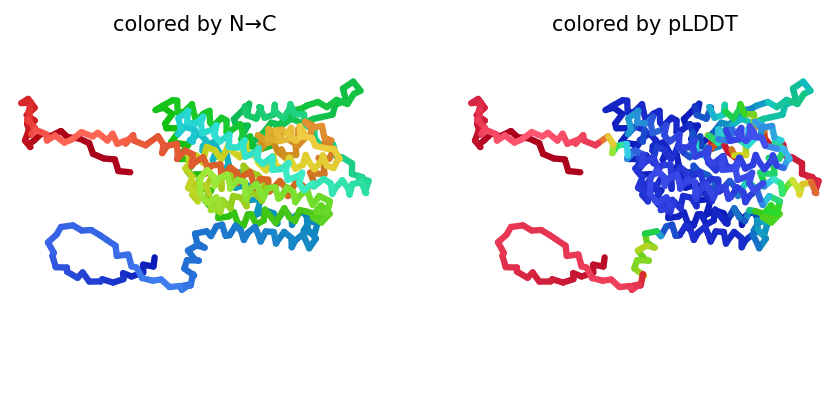

2023-11-09 06:29:52,861 alphafold2_ptm_model_1_seed_001 recycle=0 pLDDT=69.9 pTM=0.628
2023-11-09 06:30:02,797 alphafold2_ptm_model_1_seed_001 recycle=1 pLDDT=70.9 pTM=0.646 tol=4.19
2023-11-09 06:30:12,804 alphafold2_ptm_model_1_seed_001 recycle=2 pLDDT=75.5 pTM=0.729 tol=3.33
2023-11-09 06:30:22,758 alphafold2_ptm_model_1_seed_001 recycle=3 pLDDT=75.1 pTM=0.725 tol=1.18
2023-11-09 06:30:22,759 alphafold2_ptm_model_1_seed_001 took 39.9s (3 recycles)


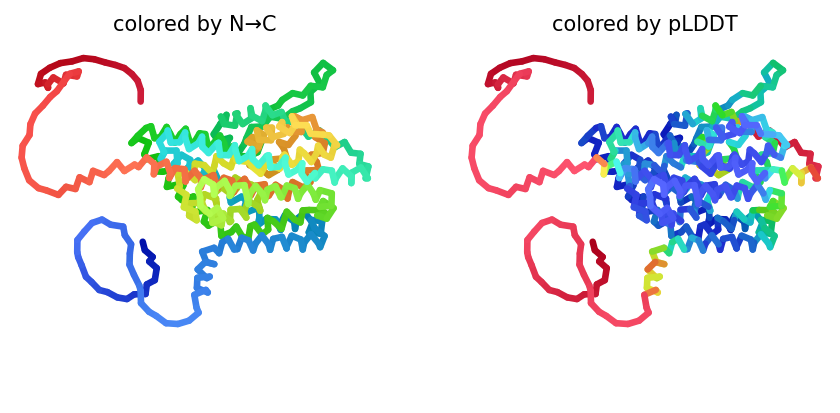

2023-11-09 06:30:33,385 alphafold2_ptm_model_2_seed_001 recycle=0 pLDDT=70.8 pTM=0.629
2023-11-09 06:30:43,352 alphafold2_ptm_model_2_seed_001 recycle=1 pLDDT=70.6 pTM=0.644 tol=4.14
2023-11-09 06:30:53,406 alphafold2_ptm_model_2_seed_001 recycle=2 pLDDT=75.9 pTM=0.74 tol=4.46
2023-11-09 06:31:03,396 alphafold2_ptm_model_2_seed_001 recycle=3 pLDDT=75.8 pTM=0.737 tol=2.1
2023-11-09 06:31:03,398 alphafold2_ptm_model_2_seed_001 took 40.1s (3 recycles)


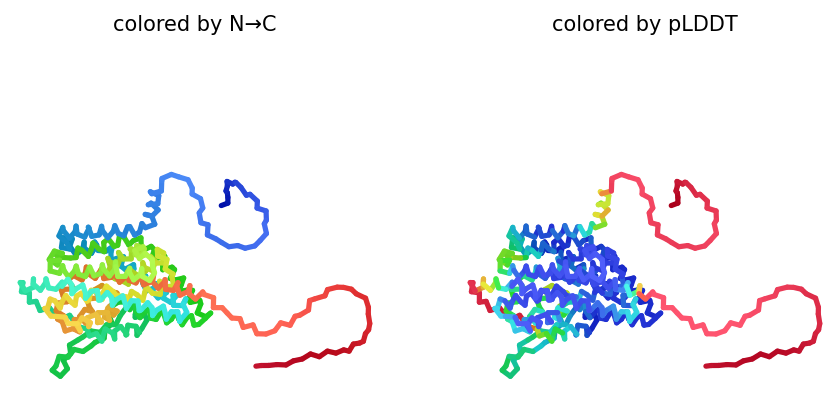

2023-11-09 06:31:14,065 alphafold2_ptm_model_3_seed_001 recycle=0 pLDDT=76.5 pTM=0.747
2023-11-09 06:31:24,072 alphafold2_ptm_model_3_seed_001 recycle=1 pLDDT=77 pTM=0.764 tol=3.94
2023-11-09 06:31:34,149 alphafold2_ptm_model_3_seed_001 recycle=2 pLDDT=77.5 pTM=0.767 tol=2.46
2023-11-09 06:31:44,186 alphafold2_ptm_model_3_seed_001 recycle=3 pLDDT=78.2 pTM=0.771 tol=1.23
2023-11-09 06:31:44,188 alphafold2_ptm_model_3_seed_001 took 40.2s (3 recycles)


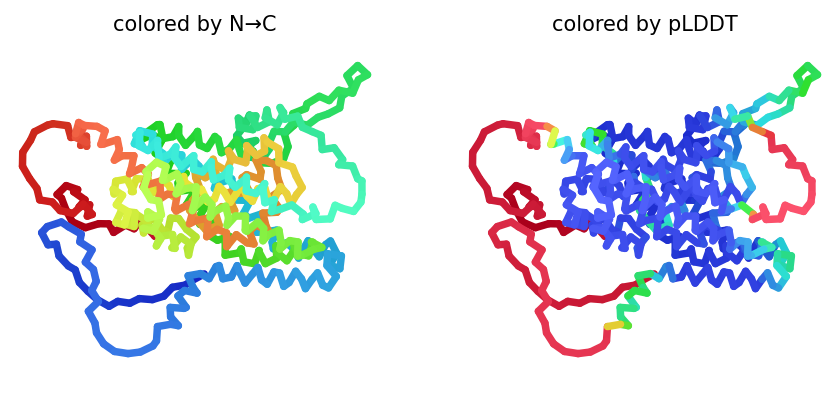

2023-11-09 06:31:54,799 alphafold2_ptm_model_4_seed_001 recycle=0 pLDDT=72 pTM=0.676
2023-11-09 06:32:04,781 alphafold2_ptm_model_4_seed_001 recycle=1 pLDDT=75.3 pTM=0.747 tol=2.66
2023-11-09 06:32:14,836 alphafold2_ptm_model_4_seed_001 recycle=2 pLDDT=75.6 pTM=0.75 tol=2.02
2023-11-09 06:32:24,826 alphafold2_ptm_model_4_seed_001 recycle=3 pLDDT=75.6 pTM=0.745 tol=1.03
2023-11-09 06:32:24,827 alphafold2_ptm_model_4_seed_001 took 40.1s (3 recycles)


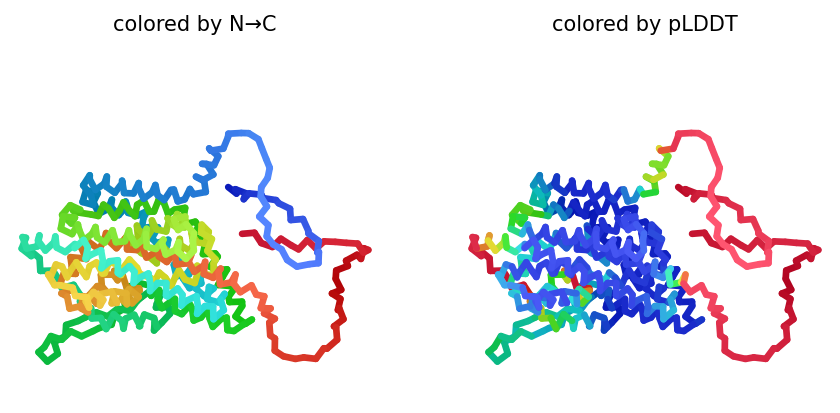

2023-11-09 06:32:35,468 alphafold2_ptm_model_5_seed_001 recycle=0 pLDDT=74.8 pTM=0.725
2023-11-09 06:32:45,524 alphafold2_ptm_model_5_seed_001 recycle=1 pLDDT=77.5 pTM=0.769 tol=3.93
2023-11-09 06:32:55,633 alphafold2_ptm_model_5_seed_001 recycle=2 pLDDT=77.1 pTM=0.761 tol=2.67
2023-11-09 06:33:05,682 alphafold2_ptm_model_5_seed_001 recycle=3 pLDDT=77.1 pTM=0.761 tol=3
2023-11-09 06:33:05,683 alphafold2_ptm_model_5_seed_001 took 40.3s (3 recycles)


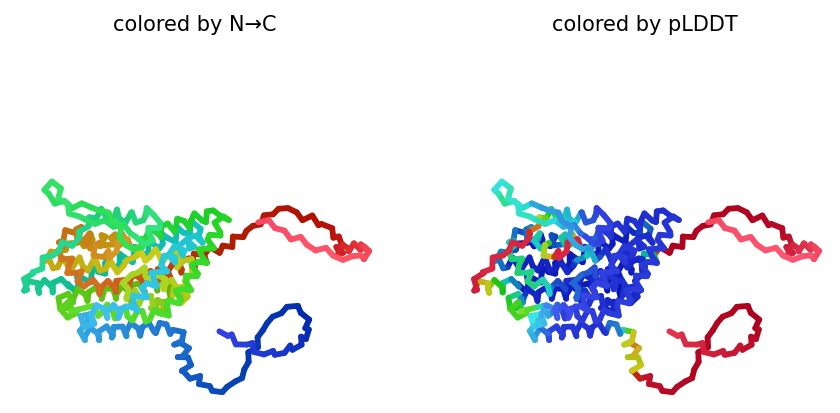

2023-11-09 06:33:21,209 alphafold2_ptm_model_1_seed_002 recycle=0 pLDDT=69.9 pTM=0.627
2023-11-09 06:33:31,174 alphafold2_ptm_model_1_seed_002 recycle=1 pLDDT=75.2 pTM=0.727 tol=3.87
2023-11-09 06:33:41,183 alphafold2_ptm_model_1_seed_002 recycle=2 pLDDT=75.6 pTM=0.737 tol=4.06
2023-11-09 06:33:51,139 alphafold2_ptm_model_1_seed_002 recycle=3 pLDDT=75.2 pTM=0.731 tol=2.73
2023-11-09 06:33:51,140 alphafold2_ptm_model_1_seed_002 took 40.0s (3 recycles)


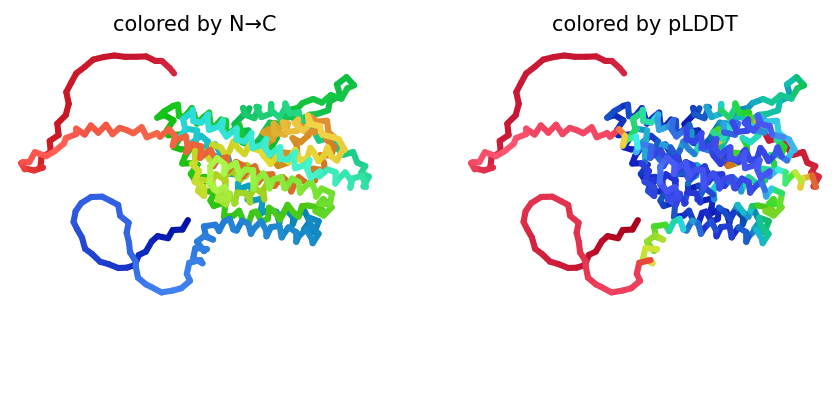

2023-11-09 06:34:01,756 alphafold2_ptm_model_2_seed_002 recycle=0 pLDDT=70.4 pTM=0.629
2023-11-09 06:34:11,745 alphafold2_ptm_model_2_seed_002 recycle=1 pLDDT=70.2 pTM=0.639 tol=6.08
2023-11-09 06:34:21,776 alphafold2_ptm_model_2_seed_002 recycle=2 pLDDT=72.1 pTM=0.689 tol=3.79
2023-11-09 06:34:31,765 alphafold2_ptm_model_2_seed_002 recycle=3 pLDDT=73.8 pTM=0.715 tol=1.95
2023-11-09 06:34:31,767 alphafold2_ptm_model_2_seed_002 took 40.0s (3 recycles)


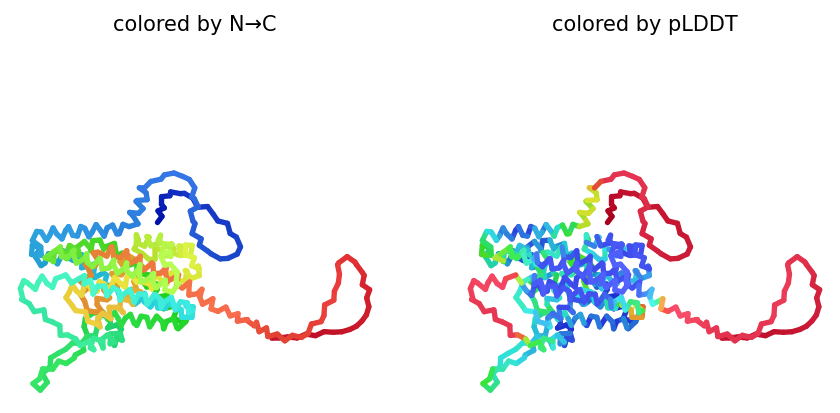

2023-11-09 06:34:42,391 alphafold2_ptm_model_3_seed_002 recycle=0 pLDDT=72.8 pTM=0.631
2023-11-09 06:34:52,383 alphafold2_ptm_model_3_seed_002 recycle=1 pLDDT=73.9 pTM=0.694 tol=2.93
2023-11-09 06:35:02,436 alphafold2_ptm_model_3_seed_002 recycle=2 pLDDT=76.6 pTM=0.756 tol=2.65
2023-11-09 06:35:12,450 alphafold2_ptm_model_3_seed_002 recycle=3 pLDDT=77.4 pTM=0.768 tol=1.79
2023-11-09 06:35:12,451 alphafold2_ptm_model_3_seed_002 took 40.1s (3 recycles)


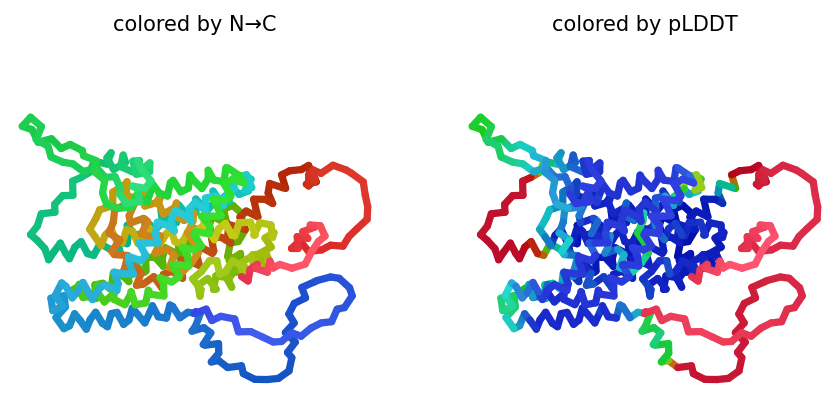

2023-11-09 06:35:23,067 alphafold2_ptm_model_4_seed_002 recycle=0 pLDDT=73.1 pTM=0.707
2023-11-09 06:35:33,078 alphafold2_ptm_model_4_seed_002 recycle=1 pLDDT=75.9 pTM=0.754 tol=2.7
2023-11-09 06:35:43,132 alphafold2_ptm_model_4_seed_002 recycle=2 pLDDT=76.1 pTM=0.754 tol=1.22
2023-11-09 06:35:53,126 alphafold2_ptm_model_4_seed_002 recycle=3 pLDDT=75.6 pTM=0.75 tol=1.25
2023-11-09 06:35:53,127 alphafold2_ptm_model_4_seed_002 took 40.1s (3 recycles)


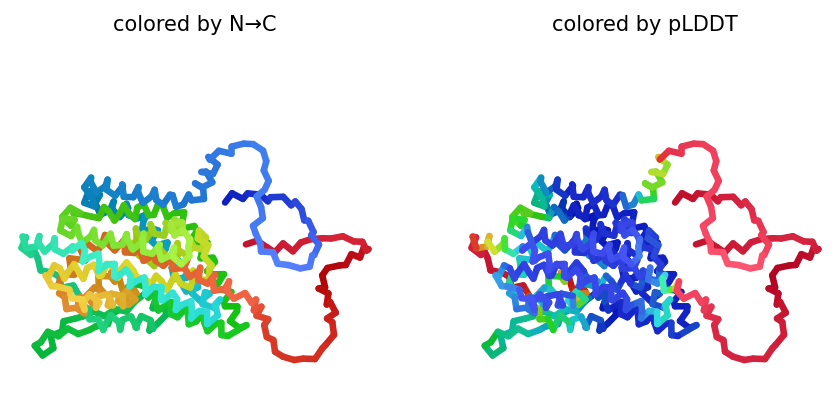

2023-11-09 06:36:03,810 alphafold2_ptm_model_5_seed_002 recycle=0 pLDDT=75.6 pTM=0.743
2023-11-09 06:36:13,861 alphafold2_ptm_model_5_seed_002 recycle=1 pLDDT=77.2 pTM=0.768 tol=3.02
2023-11-09 06:36:23,991 alphafold2_ptm_model_5_seed_002 recycle=2 pLDDT=77.9 pTM=0.776 tol=4.31
2023-11-09 06:36:34,049 alphafold2_ptm_model_5_seed_002 recycle=3 pLDDT=77.1 pTM=0.768 tol=2.48
2023-11-09 06:36:34,050 alphafold2_ptm_model_5_seed_002 took 40.3s (3 recycles)


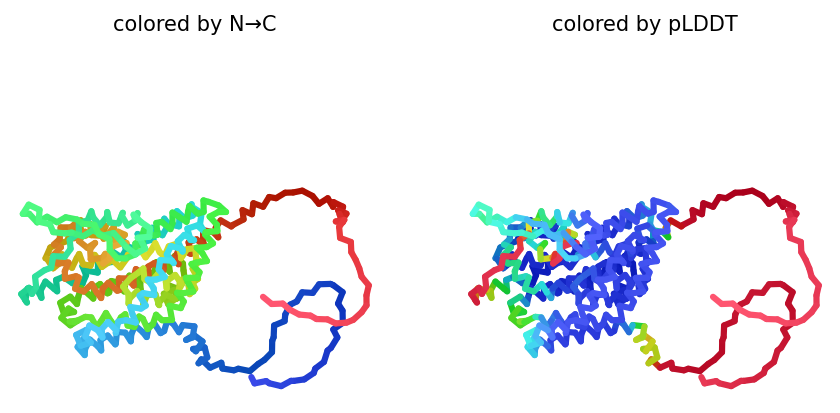

2023-11-09 06:36:49,583 alphafold2_ptm_model_1_seed_003 recycle=0 pLDDT=70.4 pTM=0.634
2023-11-09 06:36:59,583 alphafold2_ptm_model_1_seed_003 recycle=1 pLDDT=70.7 pTM=0.637 tol=4.99
2023-11-09 06:37:09,587 alphafold2_ptm_model_1_seed_003 recycle=2 pLDDT=71.9 pTM=0.68 tol=2.53
2023-11-09 06:37:19,584 alphafold2_ptm_model_1_seed_003 recycle=3 pLDDT=73.5 pTM=0.712 tol=2.32
2023-11-09 06:37:19,585 alphafold2_ptm_model_1_seed_003 took 40.0s (3 recycles)


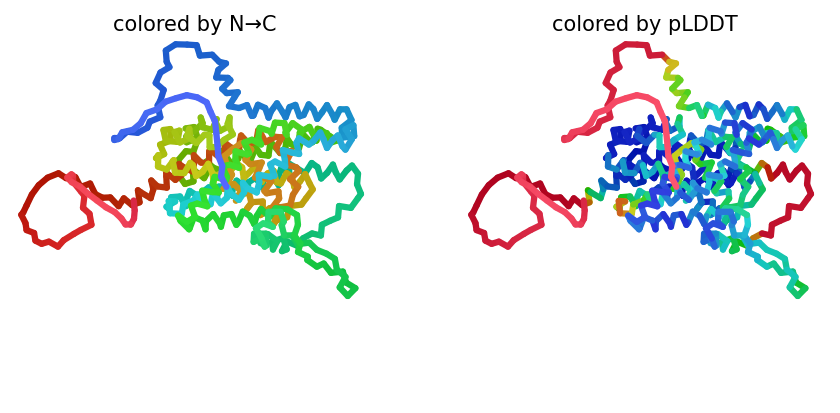

2023-11-09 06:37:30,227 alphafold2_ptm_model_2_seed_003 recycle=0 pLDDT=70.6 pTM=0.636
2023-11-09 06:37:40,252 alphafold2_ptm_model_2_seed_003 recycle=1 pLDDT=70.2 pTM=0.639 tol=7.18
2023-11-09 06:37:50,290 alphafold2_ptm_model_2_seed_003 recycle=2 pLDDT=73.4 pTM=0.714 tol=2.94
2023-11-09 06:38:00,328 alphafold2_ptm_model_2_seed_003 recycle=3 pLDDT=74.3 pTM=0.727 tol=2.59
2023-11-09 06:38:00,329 alphafold2_ptm_model_2_seed_003 took 40.1s (3 recycles)


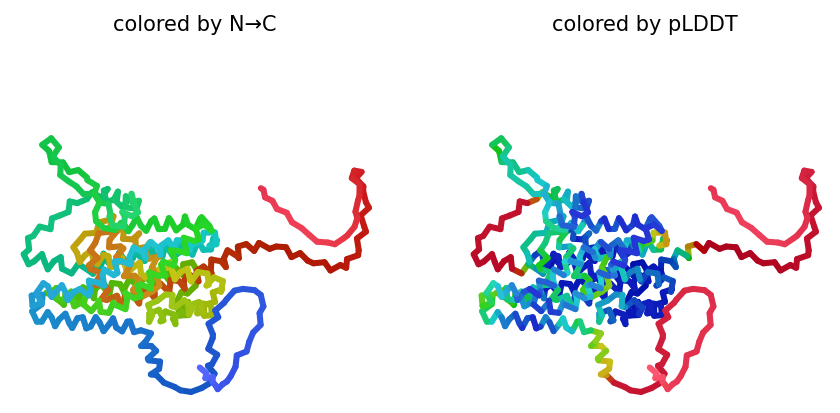

2023-11-09 06:38:10,978 alphafold2_ptm_model_3_seed_003 recycle=0 pLDDT=75.4 pTM=0.726
2023-11-09 06:38:21,041 alphafold2_ptm_model_3_seed_003 recycle=1 pLDDT=77.4 pTM=0.755 tol=5.11
2023-11-09 06:38:31,108 alphafold2_ptm_model_3_seed_003 recycle=2 pLDDT=77.6 pTM=0.766 tol=2.2
2023-11-09 06:38:41,181 alphafold2_ptm_model_3_seed_003 recycle=3 pLDDT=77.8 pTM=0.772 tol=1.45
2023-11-09 06:38:41,183 alphafold2_ptm_model_3_seed_003 took 40.3s (3 recycles)


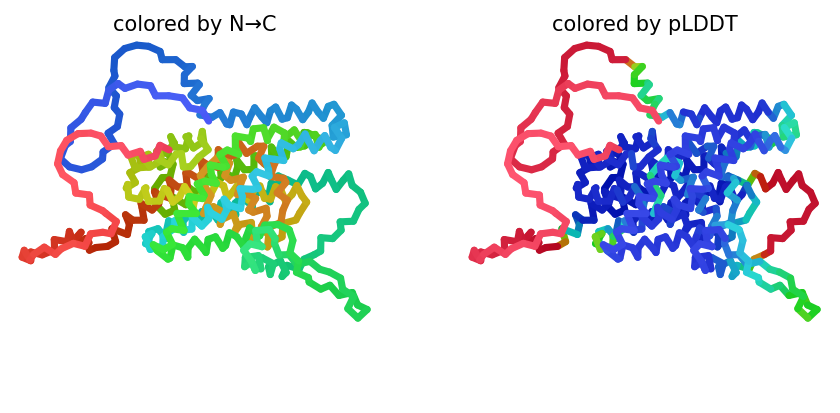

2023-11-09 06:38:51,778 alphafold2_ptm_model_4_seed_003 recycle=0 pLDDT=71.6 pTM=0.667
2023-11-09 06:39:01,828 alphafold2_ptm_model_4_seed_003 recycle=1 pLDDT=75.6 pTM=0.751 tol=3.9
2023-11-09 06:39:11,883 alphafold2_ptm_model_4_seed_003 recycle=2 pLDDT=75.6 pTM=0.745 tol=2.27
2023-11-09 06:39:21,919 alphafold2_ptm_model_4_seed_003 recycle=3 pLDDT=75.3 pTM=0.744 tol=2.31
2023-11-09 06:39:21,921 alphafold2_ptm_model_4_seed_003 took 40.2s (3 recycles)


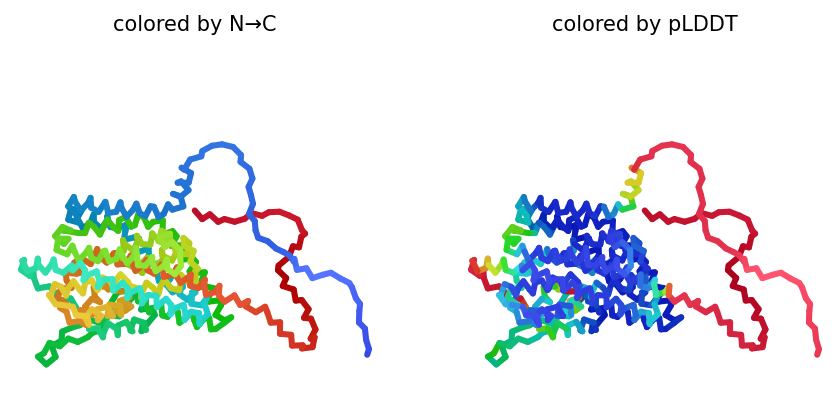

2023-11-09 06:39:32,551 alphafold2_ptm_model_5_seed_003 recycle=0 pLDDT=73.5 pTM=0.724
2023-11-09 06:39:42,679 alphafold2_ptm_model_5_seed_003 recycle=1 pLDDT=77.2 pTM=0.772 tol=6.75
2023-11-09 06:39:52,806 alphafold2_ptm_model_5_seed_003 recycle=2 pLDDT=77.4 pTM=0.769 tol=1.63
2023-11-09 06:40:02,922 alphafold2_ptm_model_5_seed_003 recycle=3 pLDDT=77.2 pTM=0.765 tol=1.82
2023-11-09 06:40:02,924 alphafold2_ptm_model_5_seed_003 took 40.4s (3 recycles)


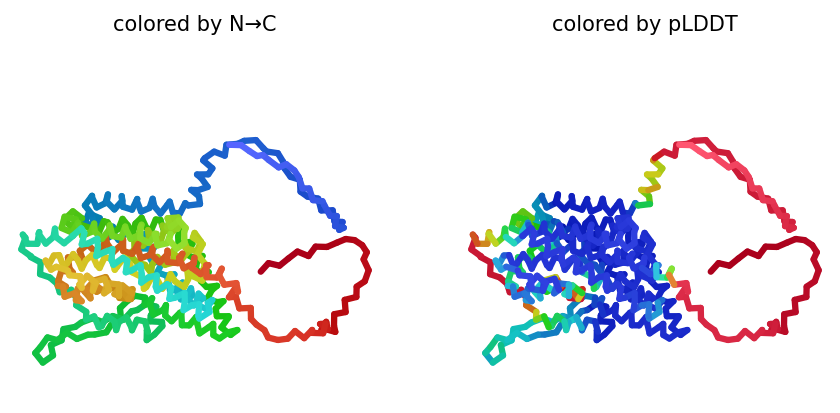

2023-11-09 06:40:18,541 alphafold2_ptm_model_1_seed_004 recycle=0 pLDDT=68.9 pTM=0.609
2023-11-09 06:40:28,495 alphafold2_ptm_model_1_seed_004 recycle=1 pLDDT=73.9 pTM=0.698 tol=5.53
2023-11-09 06:40:38,444 alphafold2_ptm_model_1_seed_004 recycle=2 pLDDT=75.2 pTM=0.735 tol=3.22
2023-11-09 06:40:48,401 alphafold2_ptm_model_1_seed_004 recycle=3 pLDDT=75.2 pTM=0.728 tol=2.62
2023-11-09 06:40:48,402 alphafold2_ptm_model_1_seed_004 took 39.8s (3 recycles)


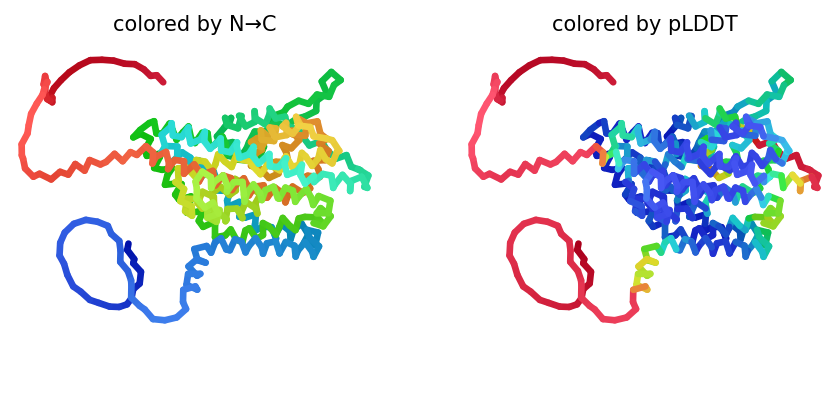

2023-11-09 06:40:59,006 alphafold2_ptm_model_2_seed_004 recycle=0 pLDDT=70.2 pTM=0.625
2023-11-09 06:41:09,053 alphafold2_ptm_model_2_seed_004 recycle=1 pLDDT=75.8 pTM=0.738 tol=5.27
2023-11-09 06:41:19,093 alphafold2_ptm_model_2_seed_004 recycle=2 pLDDT=76.2 pTM=0.752 tol=1.52
2023-11-09 06:41:29,136 alphafold2_ptm_model_2_seed_004 recycle=3 pLDDT=76.2 pTM=0.749 tol=2.32
2023-11-09 06:41:29,137 alphafold2_ptm_model_2_seed_004 took 40.1s (3 recycles)


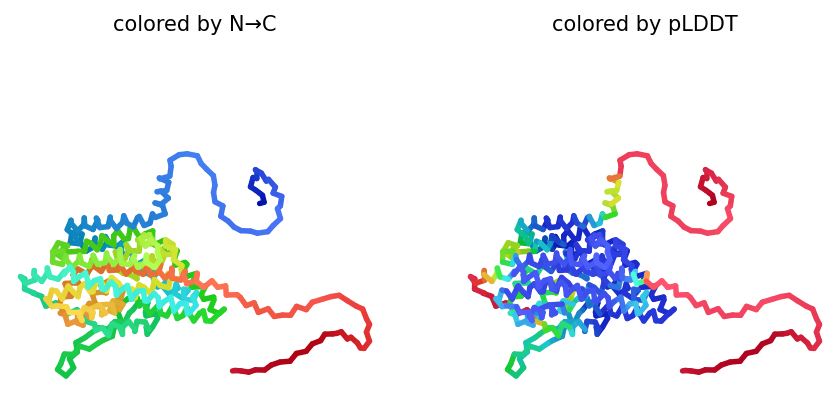

2023-11-09 06:41:39,733 alphafold2_ptm_model_3_seed_004 recycle=0 pLDDT=73.6 pTM=0.68
2023-11-09 06:41:49,777 alphafold2_ptm_model_3_seed_004 recycle=1 pLDDT=76.8 pTM=0.757 tol=4.88
2023-11-09 06:41:59,843 alphafold2_ptm_model_3_seed_004 recycle=2 pLDDT=77.9 pTM=0.769 tol=2.46
2023-11-09 06:42:09,913 alphafold2_ptm_model_3_seed_004 recycle=3 pLDDT=78.2 pTM=0.77 tol=1.94
2023-11-09 06:42:09,914 alphafold2_ptm_model_3_seed_004 took 40.2s (3 recycles)


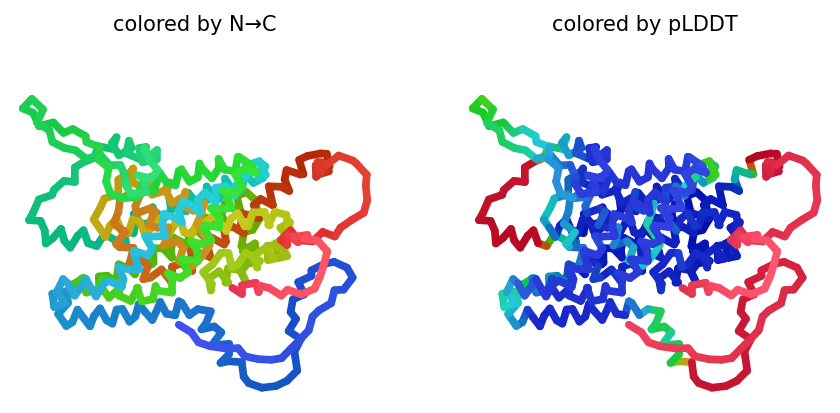

2023-11-09 06:42:20,475 alphafold2_ptm_model_4_seed_004 recycle=0 pLDDT=72.9 pTM=0.698
2023-11-09 06:42:30,488 alphafold2_ptm_model_4_seed_004 recycle=1 pLDDT=75.2 pTM=0.742 tol=3.01
2023-11-09 06:42:40,507 alphafold2_ptm_model_4_seed_004 recycle=2 pLDDT=75.2 pTM=0.747 tol=1.61
2023-11-09 06:42:50,545 alphafold2_ptm_model_4_seed_004 recycle=3 pLDDT=75.7 pTM=0.749 tol=1.06
2023-11-09 06:42:50,546 alphafold2_ptm_model_4_seed_004 took 40.0s (3 recycles)


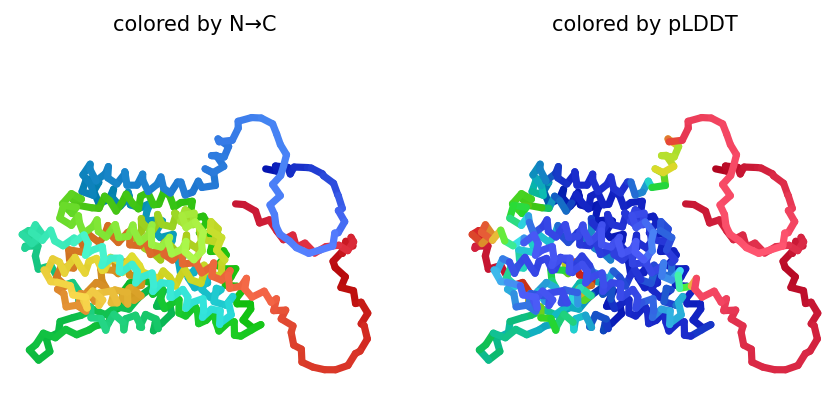

2023-11-09 06:43:01,135 alphafold2_ptm_model_5_seed_004 recycle=0 pLDDT=73.6 pTM=0.717
2023-11-09 06:43:11,228 alphafold2_ptm_model_5_seed_004 recycle=1 pLDDT=77.1 pTM=0.767 tol=5.3
2023-11-09 06:43:21,336 alphafold2_ptm_model_5_seed_004 recycle=2 pLDDT=77.6 pTM=0.773 tol=2.82
2023-11-09 06:43:31,438 alphafold2_ptm_model_5_seed_004 recycle=3 pLDDT=77.7 pTM=0.764 tol=2.12
2023-11-09 06:43:31,439 alphafold2_ptm_model_5_seed_004 took 40.3s (3 recycles)


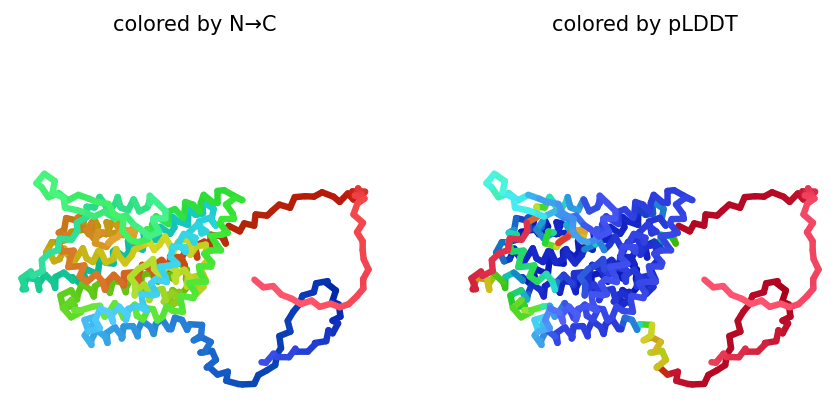

2023-11-09 06:43:46,916 alphafold2_ptm_model_1_seed_005 recycle=0 pLDDT=70.4 pTM=0.643
2023-11-09 06:43:56,872 alphafold2_ptm_model_1_seed_005 recycle=1 pLDDT=75.6 pTM=0.735 tol=6.55
2023-11-09 06:44:06,883 alphafold2_ptm_model_1_seed_005 recycle=2 pLDDT=75.9 pTM=0.74 tol=4.39
2023-11-09 06:44:16,829 alphafold2_ptm_model_1_seed_005 recycle=3 pLDDT=75.4 pTM=0.728 tol=2.29
2023-11-09 06:44:16,831 alphafold2_ptm_model_1_seed_005 took 40.0s (3 recycles)


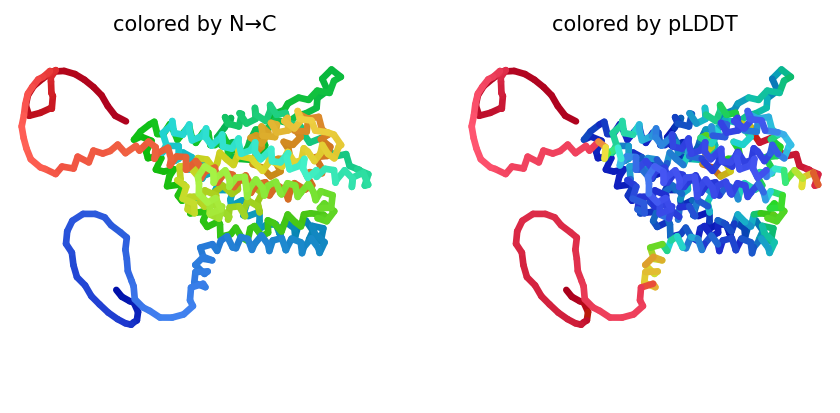

2023-11-09 06:44:27,468 alphafold2_ptm_model_2_seed_005 recycle=0 pLDDT=70.6 pTM=0.635
2023-11-09 06:44:37,458 alphafold2_ptm_model_2_seed_005 recycle=1 pLDDT=75.5 pTM=0.726 tol=4.33
2023-11-09 06:44:47,513 alphafold2_ptm_model_2_seed_005 recycle=2 pLDDT=76.3 pTM=0.748 tol=1.9
2023-11-09 06:44:57,506 alphafold2_ptm_model_2_seed_005 recycle=3 pLDDT=76.2 pTM=0.749 tol=1.62
2023-11-09 06:44:57,507 alphafold2_ptm_model_2_seed_005 took 40.1s (3 recycles)


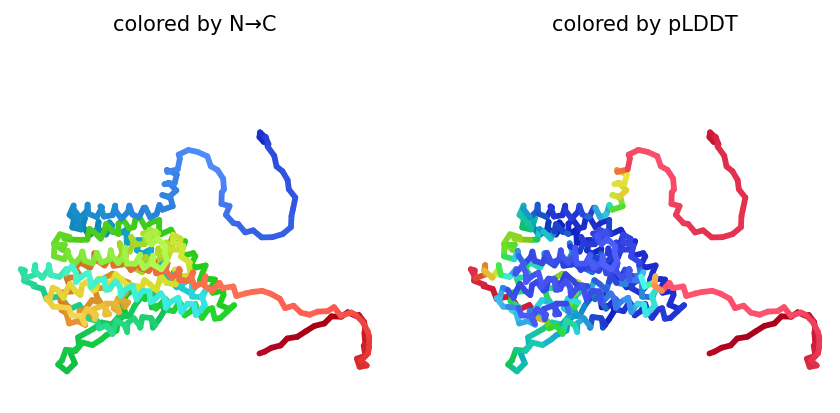

2023-11-09 06:45:08,146 alphafold2_ptm_model_3_seed_005 recycle=0 pLDDT=74.4 pTM=0.708
2023-11-09 06:45:18,138 alphafold2_ptm_model_3_seed_005 recycle=1 pLDDT=76.5 pTM=0.754 tol=3.46
2023-11-09 06:45:28,224 alphafold2_ptm_model_3_seed_005 recycle=2 pLDDT=77.6 pTM=0.769 tol=3.28
2023-11-09 06:45:38,238 alphafold2_ptm_model_3_seed_005 recycle=3 pLDDT=77.8 pTM=0.77 tol=1.15
2023-11-09 06:45:38,239 alphafold2_ptm_model_3_seed_005 took 40.1s (3 recycles)


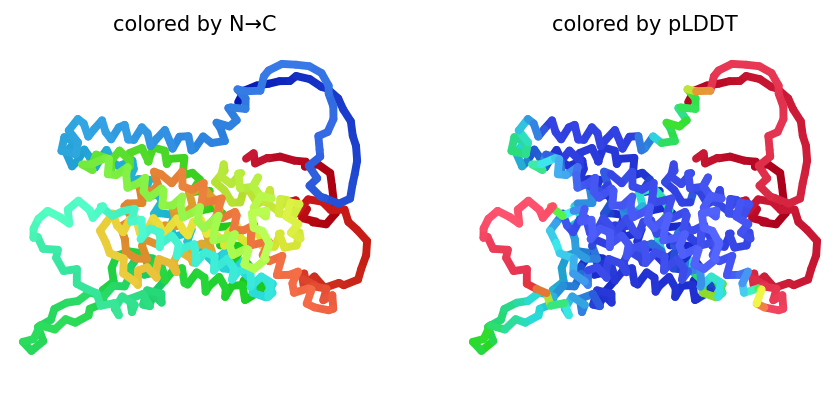

2023-11-09 06:45:48,876 alphafold2_ptm_model_4_seed_005 recycle=0 pLDDT=73.6 pTM=0.707
2023-11-09 06:45:58,872 alphafold2_ptm_model_4_seed_005 recycle=1 pLDDT=75.5 pTM=0.749 tol=3.25
2023-11-09 06:46:08,921 alphafold2_ptm_model_4_seed_005 recycle=2 pLDDT=75.4 pTM=0.744 tol=3.2
2023-11-09 06:46:18,899 alphafold2_ptm_model_4_seed_005 recycle=3 pLDDT=75.2 pTM=0.749 tol=1.33
2023-11-09 06:46:18,900 alphafold2_ptm_model_4_seed_005 took 40.1s (3 recycles)


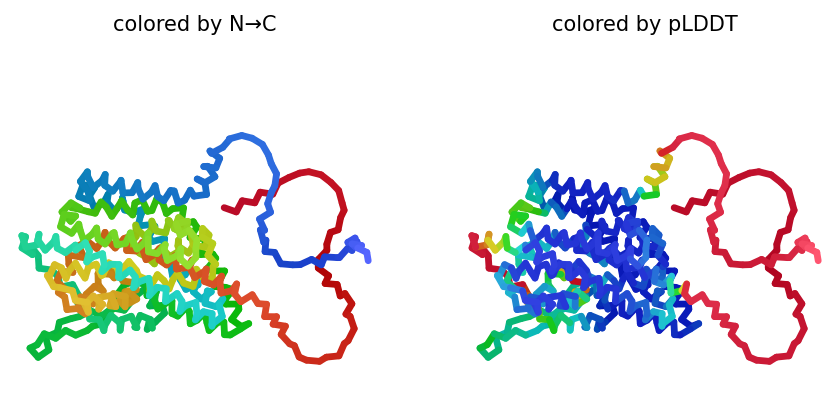

2023-11-09 06:46:29,544 alphafold2_ptm_model_5_seed_005 recycle=0 pLDDT=74.6 pTM=0.731
2023-11-09 06:46:39,601 alphafold2_ptm_model_5_seed_005 recycle=1 pLDDT=77 pTM=0.768 tol=4.68
2023-11-09 06:46:49,731 alphafold2_ptm_model_5_seed_005 recycle=2 pLDDT=77.1 pTM=0.766 tol=3.37
2023-11-09 06:46:59,773 alphafold2_ptm_model_5_seed_005 recycle=3 pLDDT=76.6 pTM=0.763 tol=1.23
2023-11-09 06:46:59,774 alphafold2_ptm_model_5_seed_005 took 40.3s (3 recycles)


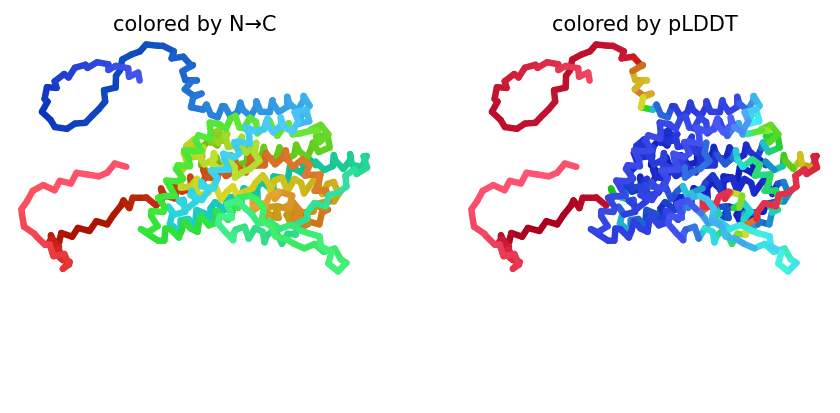

2023-11-09 06:47:15,312 alphafold2_ptm_model_1_seed_006 recycle=0 pLDDT=70.1 pTM=0.643
2023-11-09 06:47:25,314 alphafold2_ptm_model_1_seed_006 recycle=1 pLDDT=72 pTM=0.657 tol=7.18
2023-11-09 06:47:35,321 alphafold2_ptm_model_1_seed_006 recycle=2 pLDDT=75.6 pTM=0.735 tol=3.68
2023-11-09 06:47:45,325 alphafold2_ptm_model_1_seed_006 recycle=3 pLDDT=75.4 pTM=0.733 tol=2.59
2023-11-09 06:47:45,327 alphafold2_ptm_model_1_seed_006 took 40.1s (3 recycles)


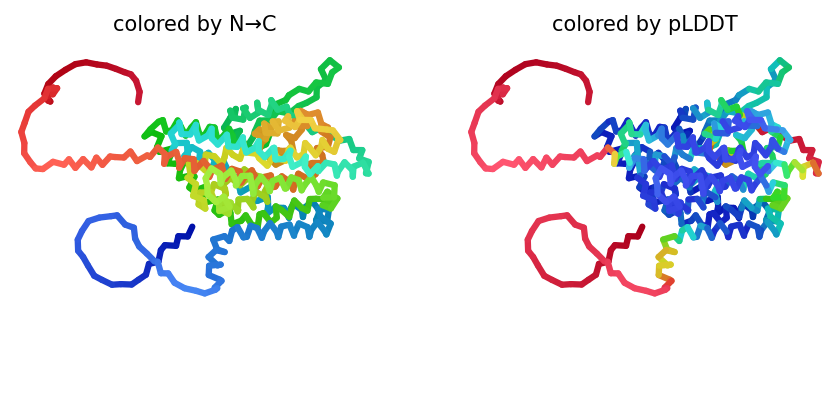

2023-11-09 06:47:55,942 alphafold2_ptm_model_2_seed_006 recycle=0 pLDDT=71.6 pTM=0.666
2023-11-09 06:48:05,982 alphafold2_ptm_model_2_seed_006 recycle=1 pLDDT=74 pTM=0.714 tol=3.75
2023-11-09 06:48:16,017 alphafold2_ptm_model_2_seed_006 recycle=2 pLDDT=74.9 pTM=0.726 tol=3.7
2023-11-09 06:48:26,063 alphafold2_ptm_model_2_seed_006 recycle=3 pLDDT=75.2 pTM=0.733 tol=1.33
2023-11-09 06:48:26,064 alphafold2_ptm_model_2_seed_006 took 40.2s (3 recycles)


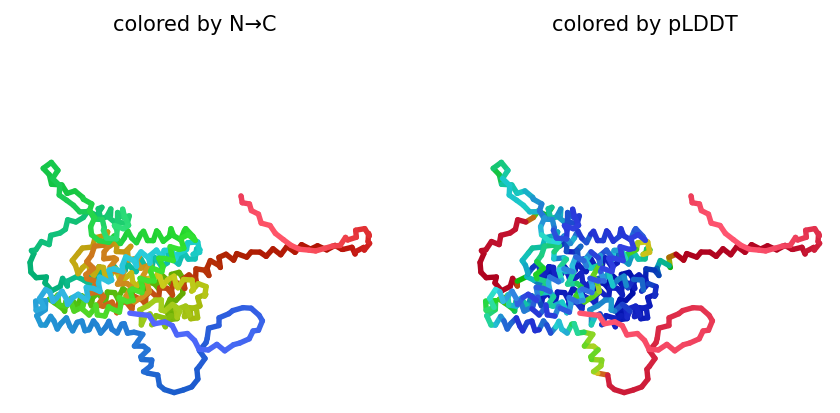

2023-11-09 06:48:36,716 alphafold2_ptm_model_3_seed_006 recycle=0 pLDDT=74.8 pTM=0.721
2023-11-09 06:48:46,783 alphafold2_ptm_model_3_seed_006 recycle=1 pLDDT=77.6 pTM=0.768 tol=2.7
2023-11-09 06:48:56,864 alphafold2_ptm_model_3_seed_006 recycle=2 pLDDT=77.9 pTM=0.768 tol=1.32
2023-11-09 06:49:06,945 alphafold2_ptm_model_3_seed_006 recycle=3 pLDDT=77.7 pTM=0.771 tol=1.07
2023-11-09 06:49:06,946 alphafold2_ptm_model_3_seed_006 took 40.3s (3 recycles)


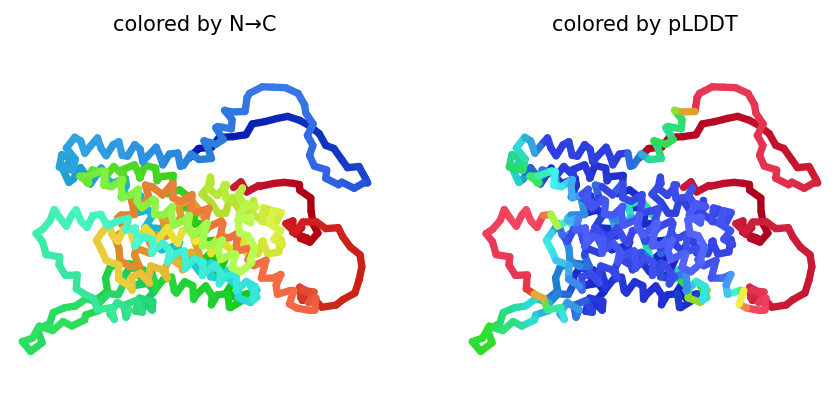

2023-11-09 06:49:17,538 alphafold2_ptm_model_4_seed_006 recycle=0 pLDDT=72.4 pTM=0.691
2023-11-09 06:49:27,589 alphafold2_ptm_model_4_seed_006 recycle=1 pLDDT=75.8 pTM=0.753 tol=3.24
2023-11-09 06:49:37,639 alphafold2_ptm_model_4_seed_006 recycle=2 pLDDT=75.8 pTM=0.752 tol=1.39
2023-11-09 06:49:47,678 alphafold2_ptm_model_4_seed_006 recycle=3 pLDDT=75.6 pTM=0.75 tol=1.5
2023-11-09 06:49:47,680 alphafold2_ptm_model_4_seed_006 took 40.2s (3 recycles)


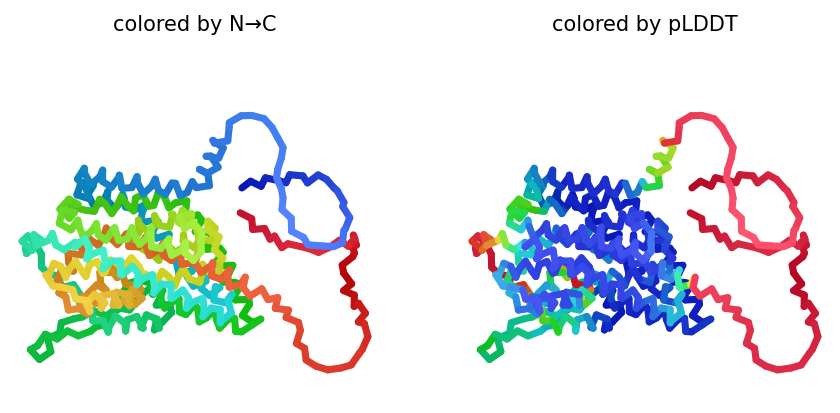

2023-11-09 06:49:58,312 alphafold2_ptm_model_5_seed_006 recycle=0 pLDDT=73.2 pTM=0.717
2023-11-09 06:50:08,438 alphafold2_ptm_model_5_seed_006 recycle=1 pLDDT=77.9 pTM=0.776 tol=5.55
2023-11-09 06:50:18,560 alphafold2_ptm_model_5_seed_006 recycle=2 pLDDT=77.4 pTM=0.769 tol=2.01
2023-11-09 06:50:28,664 alphafold2_ptm_model_5_seed_006 recycle=3 pLDDT=77 pTM=0.765 tol=2.3
2023-11-09 06:50:28,665 alphafold2_ptm_model_5_seed_006 took 40.4s (3 recycles)


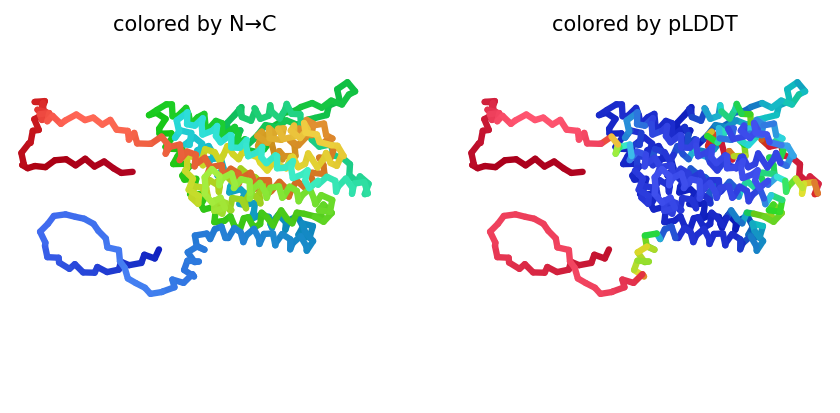

2023-11-09 06:50:44,407 alphafold2_ptm_model_1_seed_007 recycle=0 pLDDT=70.1 pTM=0.619
2023-11-09 06:50:54,416 alphafold2_ptm_model_1_seed_007 recycle=1 pLDDT=75.2 pTM=0.723 tol=4.5
2023-11-09 06:51:04,416 alphafold2_ptm_model_1_seed_007 recycle=2 pLDDT=74.9 pTM=0.731 tol=2.98
2023-11-09 06:51:14,427 alphafold2_ptm_model_1_seed_007 recycle=3 pLDDT=75.1 pTM=0.726 tol=2.65
2023-11-09 06:51:14,429 alphafold2_ptm_model_1_seed_007 took 40.1s (3 recycles)


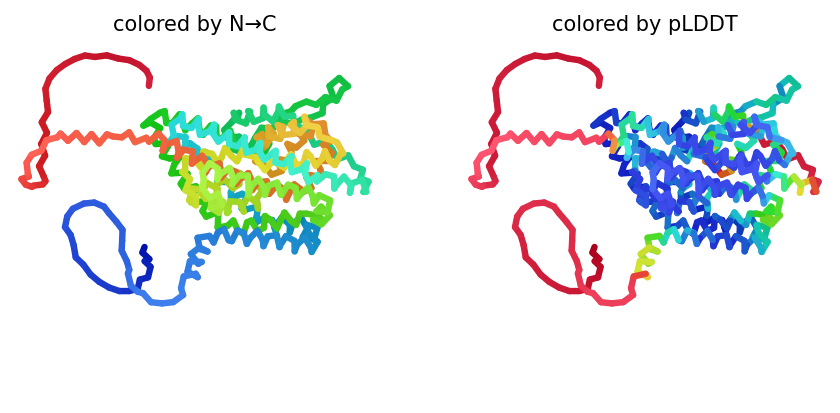

2023-11-09 06:51:25,052 alphafold2_ptm_model_2_seed_007 recycle=0 pLDDT=70.6 pTM=0.626
2023-11-09 06:51:35,092 alphafold2_ptm_model_2_seed_007 recycle=1 pLDDT=74.1 pTM=0.711 tol=4.92
2023-11-09 06:51:45,140 alphafold2_ptm_model_2_seed_007 recycle=2 pLDDT=75.4 pTM=0.74 tol=1.72
2023-11-09 06:51:55,205 alphafold2_ptm_model_2_seed_007 recycle=3 pLDDT=76.1 pTM=0.748 tol=2.45
2023-11-09 06:51:55,206 alphafold2_ptm_model_2_seed_007 took 40.2s (3 recycles)


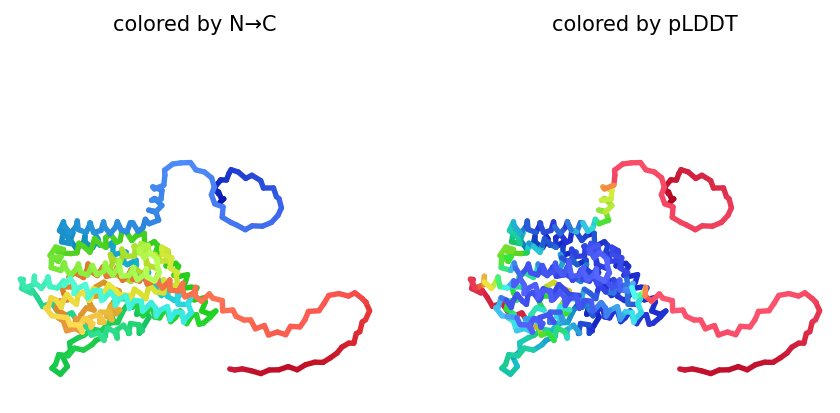

2023-11-09 06:52:05,863 alphafold2_ptm_model_3_seed_007 recycle=0 pLDDT=74.8 pTM=0.711
2023-11-09 06:52:15,936 alphafold2_ptm_model_3_seed_007 recycle=1 pLDDT=77.9 pTM=0.767 tol=4.02
2023-11-09 06:52:26,014 alphafold2_ptm_model_3_seed_007 recycle=2 pLDDT=77.6 pTM=0.769 tol=1.54
2023-11-09 06:52:36,098 alphafold2_ptm_model_3_seed_007 recycle=3 pLDDT=77.9 pTM=0.772 tol=1.59
2023-11-09 06:52:36,099 alphafold2_ptm_model_3_seed_007 took 40.3s (3 recycles)


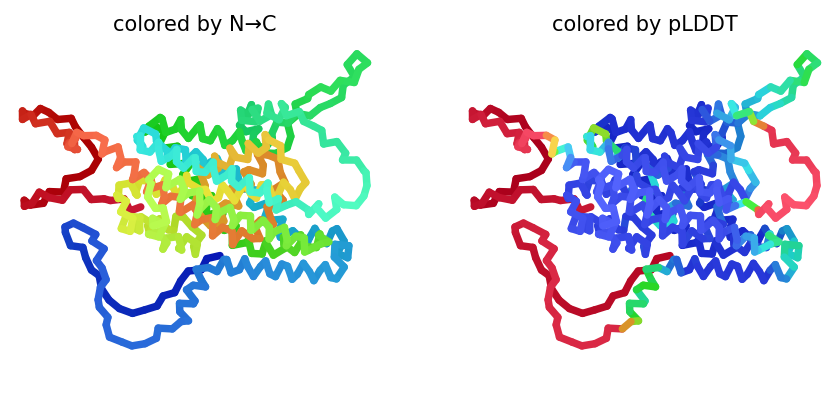

2023-11-09 06:52:47,017 alphafold2_ptm_model_4_seed_007 recycle=0 pLDDT=71.4 pTM=0.66
2023-11-09 06:52:57,010 alphafold2_ptm_model_4_seed_007 recycle=1 pLDDT=75.8 pTM=0.752 tol=3.27
2023-11-09 06:53:07,042 alphafold2_ptm_model_4_seed_007 recycle=2 pLDDT=74.8 pTM=0.741 tol=1.13
2023-11-09 06:53:17,023 alphafold2_ptm_model_4_seed_007 recycle=3 pLDDT=75.1 pTM=0.741 tol=1.39
2023-11-09 06:53:17,024 alphafold2_ptm_model_4_seed_007 took 40.0s (3 recycles)


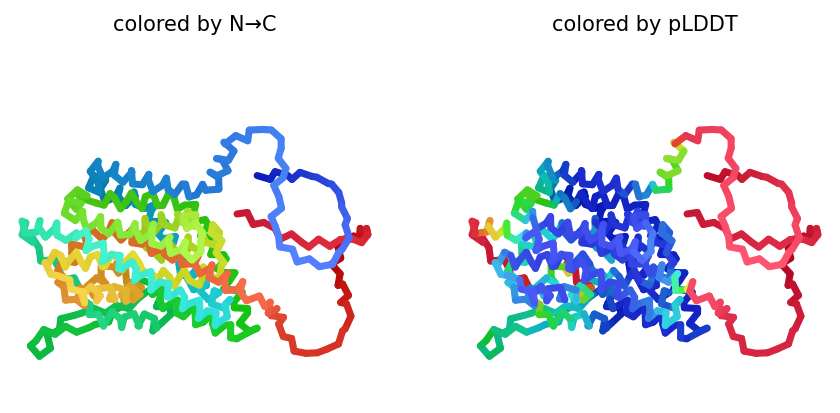

2023-11-09 06:53:27,676 alphafold2_ptm_model_5_seed_007 recycle=0 pLDDT=74.9 pTM=0.736
2023-11-09 06:53:37,767 alphafold2_ptm_model_5_seed_007 recycle=1 pLDDT=78 pTM=0.776 tol=4.44
2023-11-09 06:53:47,870 alphafold2_ptm_model_5_seed_007 recycle=2 pLDDT=76.8 pTM=0.766 tol=2.56
2023-11-09 06:53:57,940 alphafold2_ptm_model_5_seed_007 recycle=3 pLDDT=77.2 pTM=0.765 tol=1.46
2023-11-09 06:53:57,941 alphafold2_ptm_model_5_seed_007 took 40.3s (3 recycles)


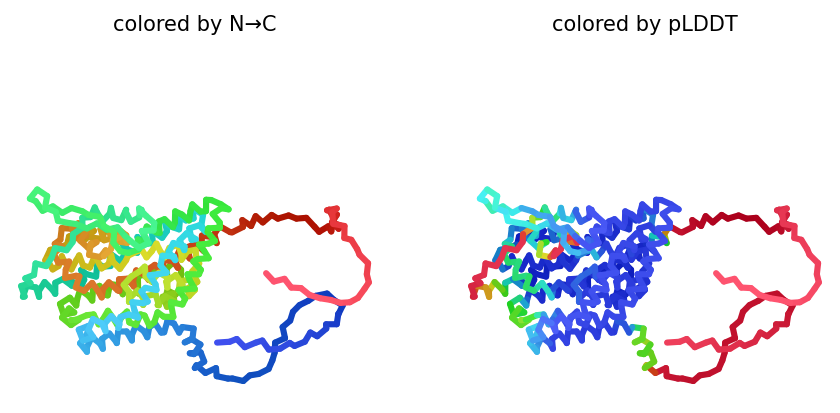

2023-11-09 06:54:13,338 alphafold2_ptm_model_1_seed_008 recycle=0 pLDDT=69.6 pTM=0.63
2023-11-09 06:54:23,284 alphafold2_ptm_model_1_seed_008 recycle=1 pLDDT=71.9 pTM=0.68 tol=3.73
2023-11-09 06:54:33,277 alphafold2_ptm_model_1_seed_008 recycle=2 pLDDT=72.9 pTM=0.708 tol=1.82
2023-11-09 06:54:43,224 alphafold2_ptm_model_1_seed_008 recycle=3 pLDDT=73.6 pTM=0.72 tol=1.9
2023-11-09 06:54:43,225 alphafold2_ptm_model_1_seed_008 took 39.9s (3 recycles)


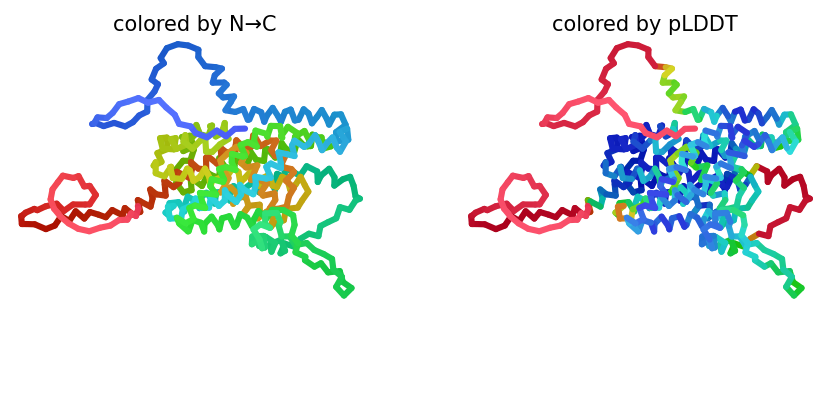

2023-11-09 06:54:53,856 alphafold2_ptm_model_2_seed_008 recycle=0 pLDDT=69.3 pTM=0.612
2023-11-09 06:55:03,854 alphafold2_ptm_model_2_seed_008 recycle=1 pLDDT=75.2 pTM=0.726 tol=4.75
2023-11-09 06:55:13,892 alphafold2_ptm_model_2_seed_008 recycle=2 pLDDT=75.5 pTM=0.741 tol=3.79
2023-11-09 06:55:23,881 alphafold2_ptm_model_2_seed_008 recycle=3 pLDDT=75.8 pTM=0.739 tol=2.43
2023-11-09 06:55:23,882 alphafold2_ptm_model_2_seed_008 took 40.1s (3 recycles)


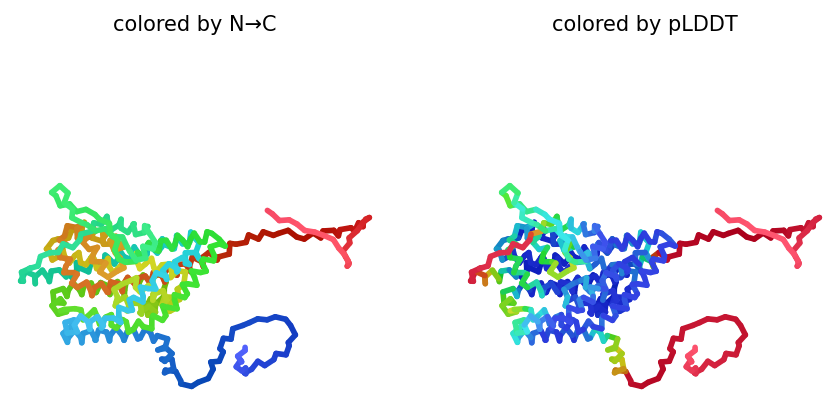

2023-11-09 06:55:34,499 alphafold2_ptm_model_3_seed_008 recycle=0 pLDDT=73 pTM=0.686
2023-11-09 06:55:44,560 alphafold2_ptm_model_3_seed_008 recycle=1 pLDDT=76.9 pTM=0.763 tol=7.29
2023-11-09 06:55:54,621 alphafold2_ptm_model_3_seed_008 recycle=2 pLDDT=77.3 pTM=0.764 tol=2.22
2023-11-09 06:56:04,683 alphafold2_ptm_model_3_seed_008 recycle=3 pLDDT=77.3 pTM=0.763 tol=1.42
2023-11-09 06:56:04,684 alphafold2_ptm_model_3_seed_008 took 40.2s (3 recycles)


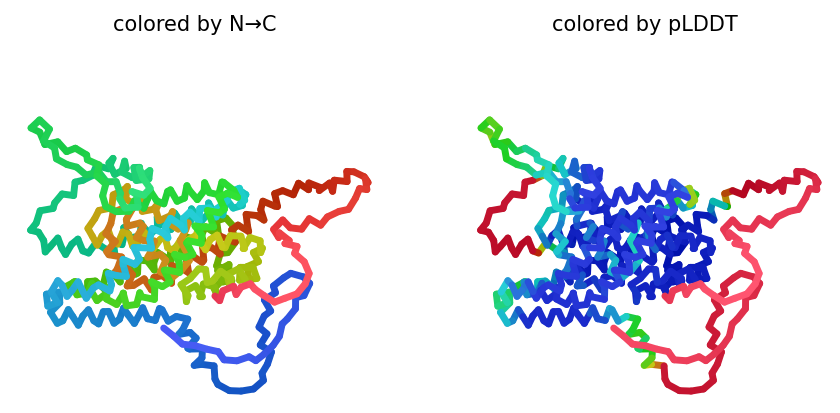

2023-11-09 06:56:15,289 alphafold2_ptm_model_4_seed_008 recycle=0 pLDDT=72.3 pTM=0.683
2023-11-09 06:56:25,339 alphafold2_ptm_model_4_seed_008 recycle=1 pLDDT=75.8 pTM=0.751 tol=2.53
2023-11-09 06:56:35,368 alphafold2_ptm_model_4_seed_008 recycle=2 pLDDT=74.4 pTM=0.741 tol=1.72
2023-11-09 06:56:45,414 alphafold2_ptm_model_4_seed_008 recycle=3 pLDDT=75.2 pTM=0.745 tol=0.918
2023-11-09 06:56:45,416 alphafold2_ptm_model_4_seed_008 took 40.1s (3 recycles)


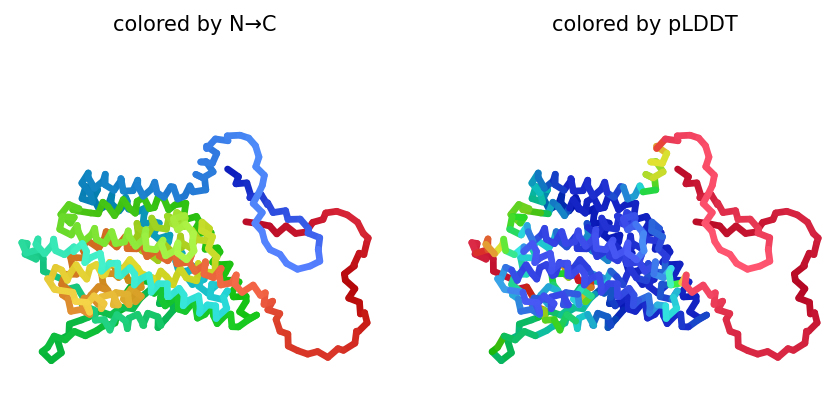

2023-11-09 06:56:56,045 alphafold2_ptm_model_5_seed_008 recycle=0 pLDDT=73.5 pTM=0.716
2023-11-09 06:57:06,181 alphafold2_ptm_model_5_seed_008 recycle=1 pLDDT=77.9 pTM=0.771 tol=4.82
2023-11-09 06:57:16,276 alphafold2_ptm_model_5_seed_008 recycle=2 pLDDT=76.6 pTM=0.758 tol=2.3
2023-11-09 06:57:26,396 alphafold2_ptm_model_5_seed_008 recycle=3 pLDDT=76.9 pTM=0.761 tol=1.62
2023-11-09 06:57:26,398 alphafold2_ptm_model_5_seed_008 took 40.4s (3 recycles)


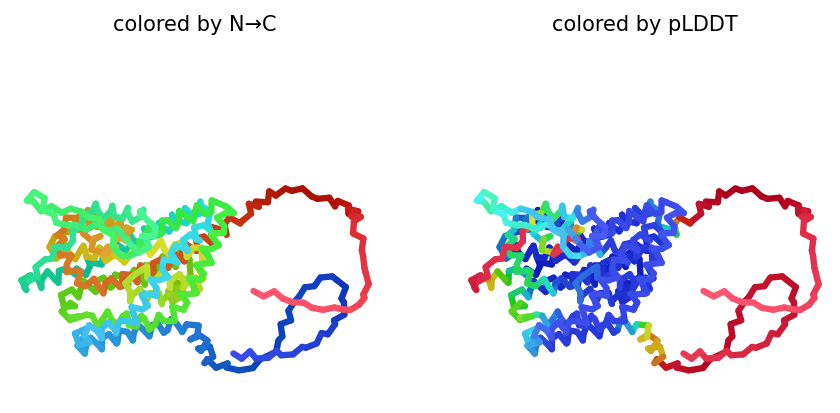

2023-11-09 06:57:41,930 alphafold2_ptm_model_1_seed_009 recycle=0 pLDDT=69.1 pTM=0.598
2023-11-09 06:57:51,943 alphafold2_ptm_model_1_seed_009 recycle=1 pLDDT=73.5 pTM=0.705 tol=6.72
2023-11-09 06:58:01,958 alphafold2_ptm_model_1_seed_009 recycle=2 pLDDT=75.7 pTM=0.738 tol=4.8
2023-11-09 06:58:11,954 alphafold2_ptm_model_1_seed_009 recycle=3 pLDDT=75.2 pTM=0.726 tol=1.95
2023-11-09 06:58:11,956 alphafold2_ptm_model_1_seed_009 took 40.1s (3 recycles)


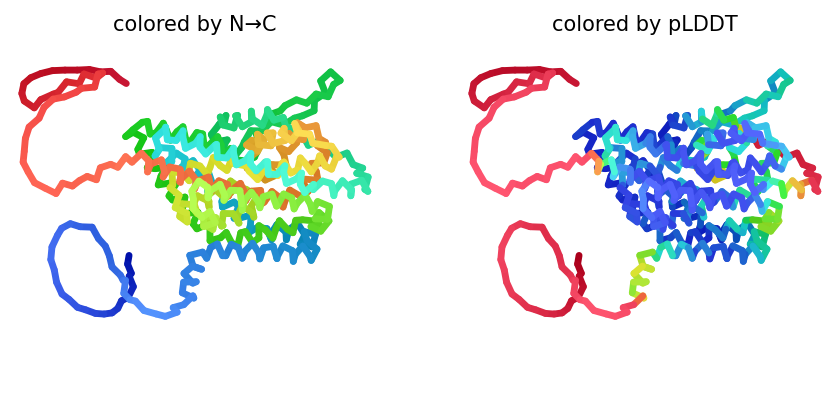

2023-11-09 06:58:22,579 alphafold2_ptm_model_2_seed_009 recycle=0 pLDDT=70.7 pTM=0.642
2023-11-09 06:58:32,628 alphafold2_ptm_model_2_seed_009 recycle=1 pLDDT=75.1 pTM=0.734 tol=4.46
2023-11-09 06:58:42,677 alphafold2_ptm_model_2_seed_009 recycle=2 pLDDT=75.8 pTM=0.738 tol=2.14
2023-11-09 06:58:52,713 alphafold2_ptm_model_2_seed_009 recycle=3 pLDDT=75.4 pTM=0.73 tol=3.23
2023-11-09 06:58:52,714 alphafold2_ptm_model_2_seed_009 took 40.2s (3 recycles)


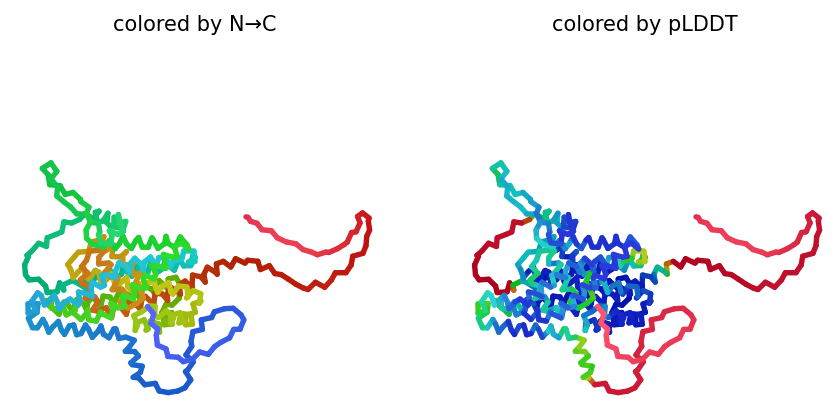

2023-11-09 06:59:03,338 alphafold2_ptm_model_3_seed_009 recycle=0 pLDDT=74.1 pTM=0.703
2023-11-09 06:59:13,411 alphafold2_ptm_model_3_seed_009 recycle=1 pLDDT=77.2 pTM=0.763 tol=4.38
2023-11-09 06:59:23,489 alphafold2_ptm_model_3_seed_009 recycle=2 pLDDT=77.8 pTM=0.768 tol=2.32
2023-11-09 06:59:33,563 alphafold2_ptm_model_3_seed_009 recycle=3 pLDDT=78.2 pTM=0.774 tol=1.44
2023-11-09 06:59:33,565 alphafold2_ptm_model_3_seed_009 took 40.3s (3 recycles)


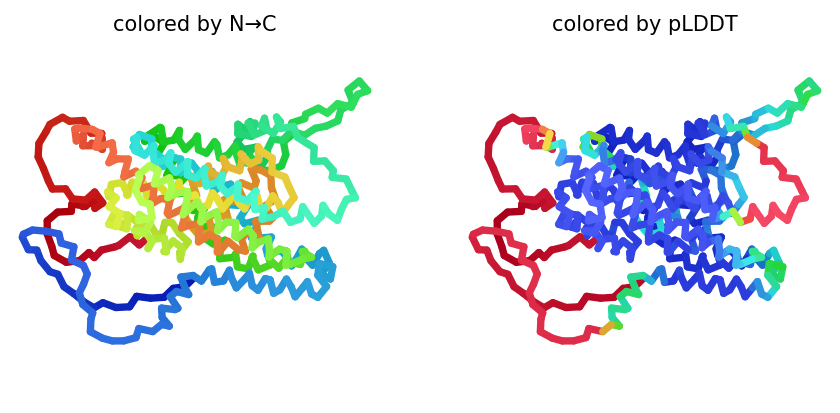

2023-11-09 06:59:44,180 alphafold2_ptm_model_4_seed_009 recycle=0 pLDDT=70.9 pTM=0.654
2023-11-09 06:59:54,231 alphafold2_ptm_model_4_seed_009 recycle=1 pLDDT=75 pTM=0.749 tol=3.35
2023-11-09 07:00:04,294 alphafold2_ptm_model_4_seed_009 recycle=2 pLDDT=76 pTM=0.756 tol=1.94
2023-11-09 07:00:14,356 alphafold2_ptm_model_4_seed_009 recycle=3 pLDDT=75.9 pTM=0.748 tol=1.43
2023-11-09 07:00:14,357 alphafold2_ptm_model_4_seed_009 took 40.2s (3 recycles)


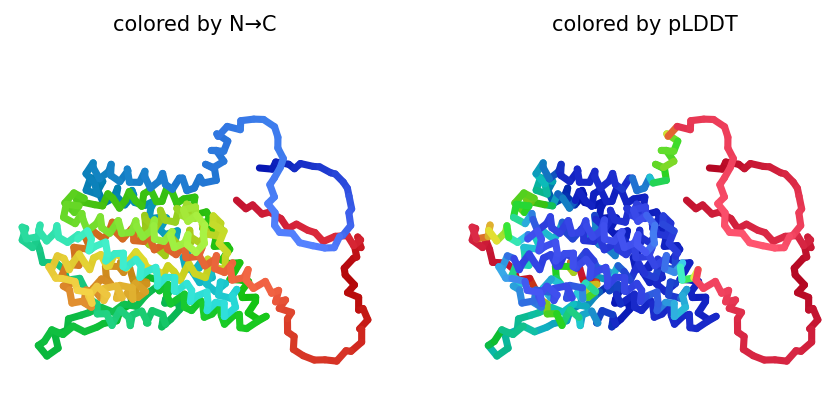

2023-11-09 07:00:24,983 alphafold2_ptm_model_5_seed_009 recycle=0 pLDDT=72.9 pTM=0.696
2023-11-09 07:00:35,118 alphafold2_ptm_model_5_seed_009 recycle=1 pLDDT=77.6 pTM=0.775 tol=4.2
2023-11-09 07:00:45,239 alphafold2_ptm_model_5_seed_009 recycle=2 pLDDT=77.6 pTM=0.769 tol=2.85
2023-11-09 07:00:55,343 alphafold2_ptm_model_5_seed_009 recycle=3 pLDDT=77.1 pTM=0.762 tol=3.16
2023-11-09 07:00:55,345 alphafold2_ptm_model_5_seed_009 took 40.4s (3 recycles)


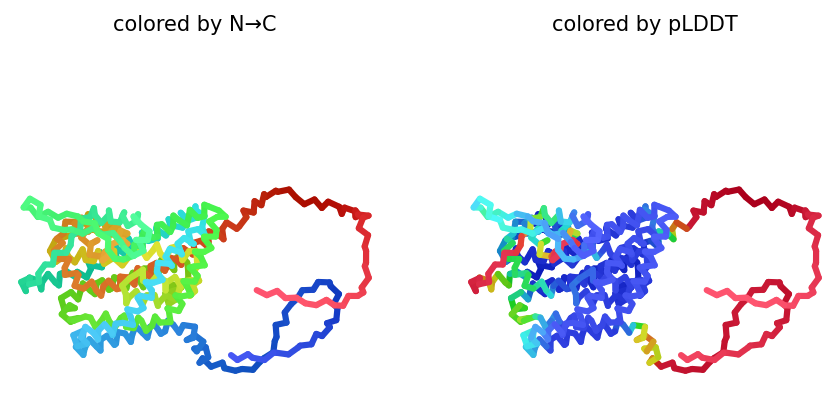

2023-11-09 07:01:10,937 alphafold2_ptm_model_1_seed_010 recycle=0 pLDDT=69.8 pTM=0.609
2023-11-09 07:01:20,951 alphafold2_ptm_model_1_seed_010 recycle=1 pLDDT=74.6 pTM=0.714 tol=3.84
2023-11-09 07:01:30,964 alphafold2_ptm_model_1_seed_010 recycle=2 pLDDT=75.1 pTM=0.738 tol=1.97
2023-11-09 07:01:40,976 alphafold2_ptm_model_1_seed_010 recycle=3 pLDDT=74.9 pTM=0.726 tol=2.44
2023-11-09 07:01:40,977 alphafold2_ptm_model_1_seed_010 took 40.1s (3 recycles)


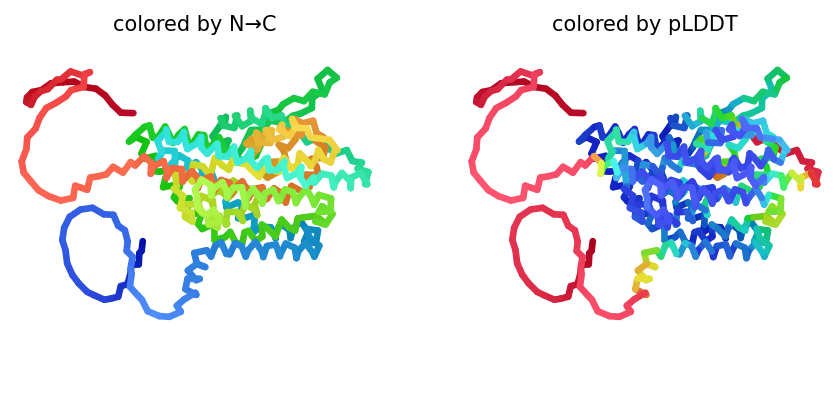

2023-11-09 07:01:51,609 alphafold2_ptm_model_2_seed_010 recycle=0 pLDDT=71.4 pTM=0.634
2023-11-09 07:02:01,651 alphafold2_ptm_model_2_seed_010 recycle=1 pLDDT=74.3 pTM=0.712 tol=3.16
2023-11-09 07:02:11,705 alphafold2_ptm_model_2_seed_010 recycle=2 pLDDT=74.9 pTM=0.724 tol=2.71
2023-11-09 07:02:21,758 alphafold2_ptm_model_2_seed_010 recycle=3 pLDDT=74.8 pTM=0.721 tol=2.95
2023-11-09 07:02:21,760 alphafold2_ptm_model_2_seed_010 took 40.2s (3 recycles)


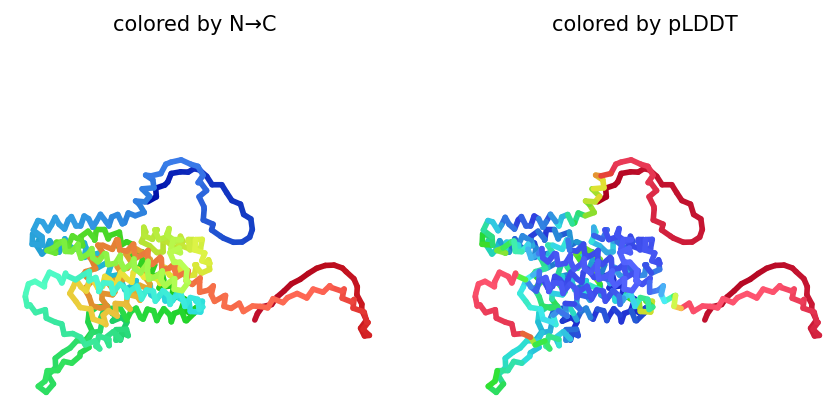

2023-11-09 07:02:32,403 alphafold2_ptm_model_3_seed_010 recycle=0 pLDDT=75.6 pTM=0.718
2023-11-09 07:02:42,500 alphafold2_ptm_model_3_seed_010 recycle=1 pLDDT=78.1 pTM=0.767 tol=2.98
2023-11-09 07:02:52,590 alphafold2_ptm_model_3_seed_010 recycle=2 pLDDT=77.9 pTM=0.771 tol=1.59
2023-11-09 07:03:02,677 alphafold2_ptm_model_3_seed_010 recycle=3 pLDDT=78.2 pTM=0.773 tol=1.16
2023-11-09 07:03:02,679 alphafold2_ptm_model_3_seed_010 took 40.3s (3 recycles)


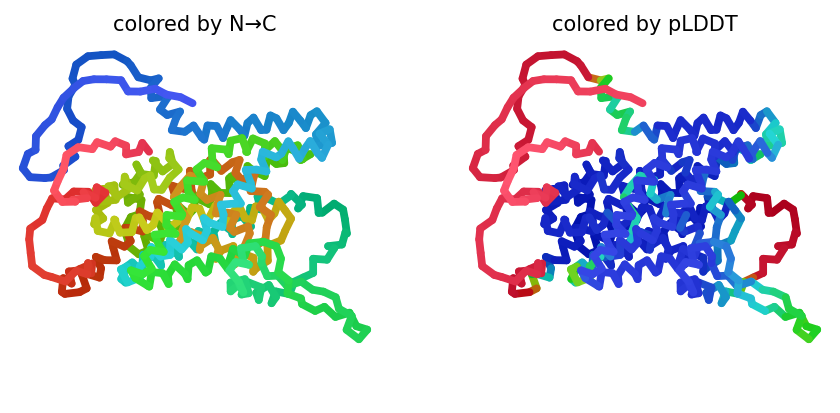

2023-11-09 07:03:13,319 alphafold2_ptm_model_4_seed_010 recycle=0 pLDDT=72.4 pTM=0.67
2023-11-09 07:03:23,390 alphafold2_ptm_model_4_seed_010 recycle=1 pLDDT=76.1 pTM=0.754 tol=3.5
2023-11-09 07:03:33,439 alphafold2_ptm_model_4_seed_010 recycle=2 pLDDT=75.2 pTM=0.748 tol=1.8
2023-11-09 07:03:43,498 alphafold2_ptm_model_4_seed_010 recycle=3 pLDDT=75.8 pTM=0.752 tol=1.04
2023-11-09 07:03:43,500 alphafold2_ptm_model_4_seed_010 took 40.2s (3 recycles)


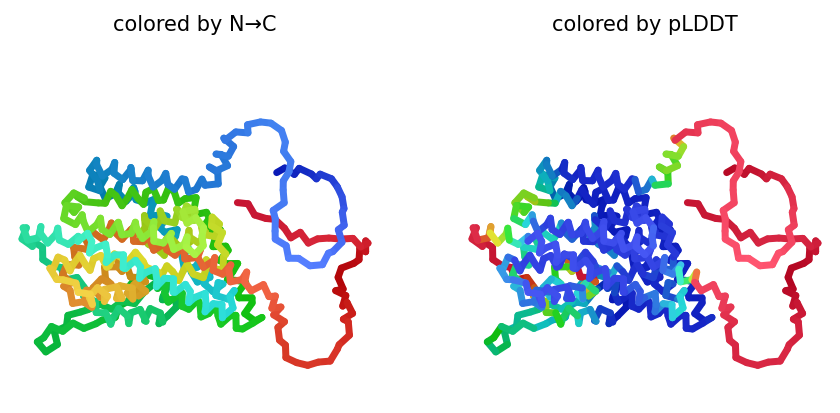

2023-11-09 07:03:54,150 alphafold2_ptm_model_5_seed_010 recycle=0 pLDDT=73.6 pTM=0.702
2023-11-09 07:04:04,287 alphafold2_ptm_model_5_seed_010 recycle=1 pLDDT=77.9 pTM=0.774 tol=2.73
2023-11-09 07:04:14,396 alphafold2_ptm_model_5_seed_010 recycle=2 pLDDT=76.8 pTM=0.765 tol=2.04
2023-11-09 07:04:24,523 alphafold2_ptm_model_5_seed_010 recycle=3 pLDDT=77.4 pTM=0.771 tol=2.77
2023-11-09 07:04:24,524 alphafold2_ptm_model_5_seed_010 took 40.4s (3 recycles)


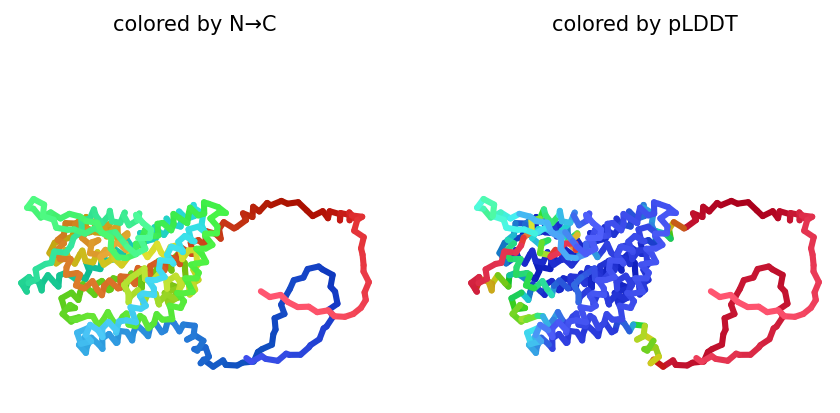

2023-11-09 07:04:40,308 alphafold2_ptm_model_1_seed_011 recycle=0 pLDDT=70.3 pTM=0.641
2023-11-09 07:04:50,255 alphafold2_ptm_model_1_seed_011 recycle=1 pLDDT=72 pTM=0.673 tol=3.3
2023-11-09 07:05:00,277 alphafold2_ptm_model_1_seed_011 recycle=2 pLDDT=74 pTM=0.72 tol=2.7
2023-11-09 07:05:10,228 alphafold2_ptm_model_1_seed_011 recycle=3 pLDDT=73.4 pTM=0.716 tol=2.07
2023-11-09 07:05:10,229 alphafold2_ptm_model_1_seed_011 took 40.0s (3 recycles)


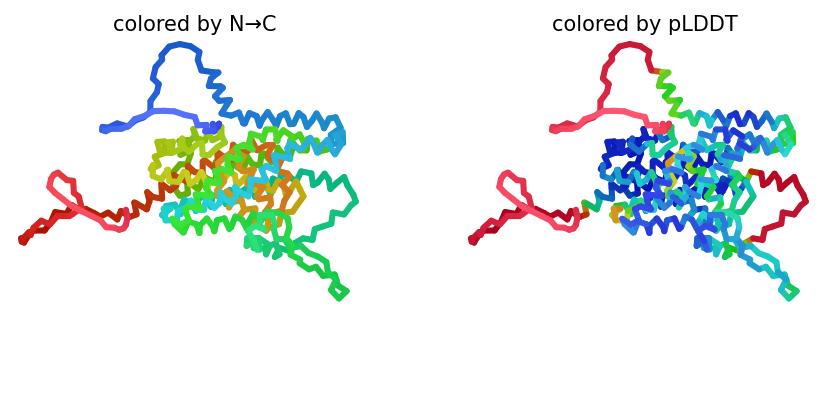

2023-11-09 07:05:20,866 alphafold2_ptm_model_2_seed_011 recycle=0 pLDDT=71.1 pTM=0.649
2023-11-09 07:05:30,861 alphafold2_ptm_model_2_seed_011 recycle=1 pLDDT=73.9 pTM=0.71 tol=5.41
2023-11-09 07:05:40,912 alphafold2_ptm_model_2_seed_011 recycle=2 pLDDT=75.4 pTM=0.738 tol=3.29
2023-11-09 07:05:50,906 alphafold2_ptm_model_2_seed_011 recycle=3 pLDDT=74.9 pTM=0.732 tol=2.76
2023-11-09 07:05:50,908 alphafold2_ptm_model_2_seed_011 took 40.1s (3 recycles)


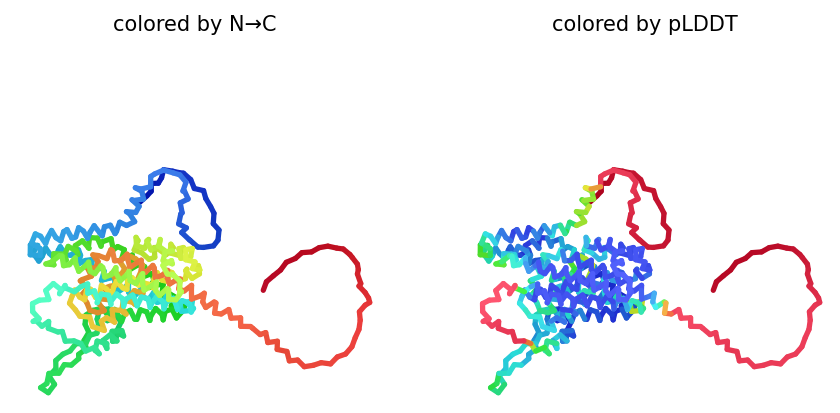

2023-11-09 07:06:01,558 alphafold2_ptm_model_3_seed_011 recycle=0 pLDDT=76.2 pTM=0.743
2023-11-09 07:06:11,585 alphafold2_ptm_model_3_seed_011 recycle=1 pLDDT=77.2 pTM=0.764 tol=4.64
2023-11-09 07:06:21,672 alphafold2_ptm_model_3_seed_011 recycle=2 pLDDT=78.1 pTM=0.77 tol=1.73
2023-11-09 07:06:31,717 alphafold2_ptm_model_3_seed_011 recycle=3 pLDDT=78.4 pTM=0.775 tol=0.965
2023-11-09 07:06:31,718 alphafold2_ptm_model_3_seed_011 took 40.2s (3 recycles)


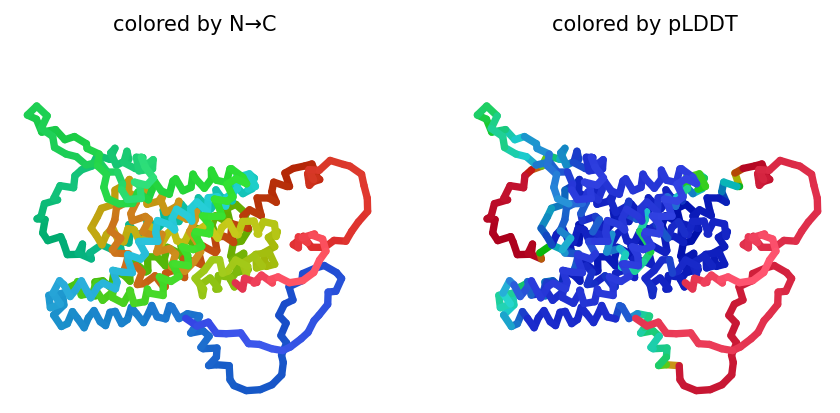

2023-11-09 07:06:42,352 alphafold2_ptm_model_4_seed_011 recycle=0 pLDDT=71.9 pTM=0.681
2023-11-09 07:06:52,348 alphafold2_ptm_model_4_seed_011 recycle=1 pLDDT=75.4 pTM=0.746 tol=3.62
2023-11-09 07:07:02,415 alphafold2_ptm_model_4_seed_011 recycle=2 pLDDT=75.9 pTM=0.751 tol=1.31
2023-11-09 07:07:12,411 alphafold2_ptm_model_4_seed_011 recycle=3 pLDDT=75.6 pTM=0.748 tol=1.18
2023-11-09 07:07:12,412 alphafold2_ptm_model_4_seed_011 took 40.1s (3 recycles)


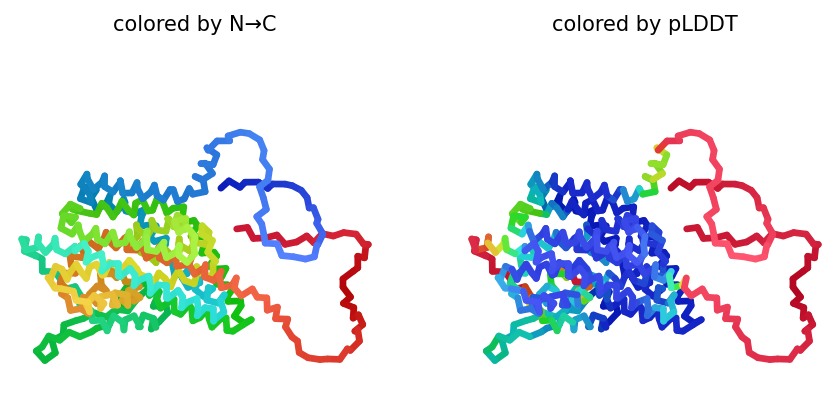

2023-11-09 07:07:23,058 alphafold2_ptm_model_5_seed_011 recycle=0 pLDDT=74.1 pTM=0.719
2023-11-09 07:07:33,125 alphafold2_ptm_model_5_seed_011 recycle=1 pLDDT=77.5 pTM=0.771 tol=2.86
2023-11-09 07:07:43,269 alphafold2_ptm_model_5_seed_011 recycle=2 pLDDT=77.8 pTM=0.769 tol=1.61
2023-11-09 07:07:53,341 alphafold2_ptm_model_5_seed_011 recycle=3 pLDDT=77.6 pTM=0.765 tol=2.16
2023-11-09 07:07:53,342 alphafold2_ptm_model_5_seed_011 took 40.4s (3 recycles)


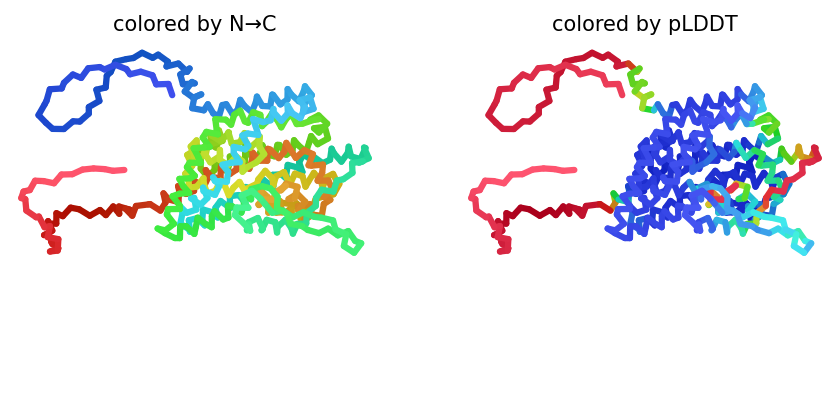

2023-11-09 07:08:08,863 alphafold2_ptm_model_1_seed_012 recycle=0 pLDDT=70.4 pTM=0.64
2023-11-09 07:08:18,859 alphafold2_ptm_model_1_seed_012 recycle=1 pLDDT=70.8 pTM=0.638 tol=4.07
2023-11-09 07:08:28,859 alphafold2_ptm_model_1_seed_012 recycle=2 pLDDT=72.4 pTM=0.673 tol=3.83
2023-11-09 07:08:38,873 alphafold2_ptm_model_1_seed_012 recycle=3 pLDDT=75.8 pTM=0.738 tol=2.67
2023-11-09 07:08:38,875 alphafold2_ptm_model_1_seed_012 took 40.1s (3 recycles)


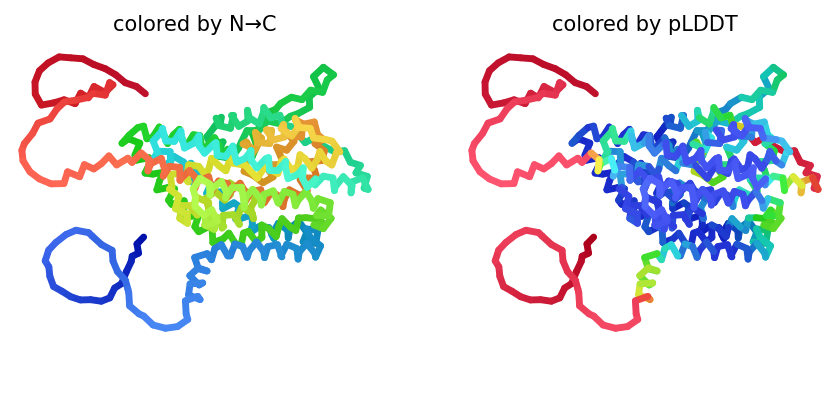

2023-11-09 07:08:49,502 alphafold2_ptm_model_2_seed_012 recycle=0 pLDDT=70.8 pTM=0.632
2023-11-09 07:08:59,540 alphafold2_ptm_model_2_seed_012 recycle=1 pLDDT=73.8 pTM=0.707 tol=4.78
2023-11-09 07:09:09,580 alphafold2_ptm_model_2_seed_012 recycle=2 pLDDT=75 pTM=0.732 tol=3.58
2023-11-09 07:09:19,634 alphafold2_ptm_model_2_seed_012 recycle=3 pLDDT=75.3 pTM=0.731 tol=1.46
2023-11-09 07:09:19,635 alphafold2_ptm_model_2_seed_012 took 40.2s (3 recycles)


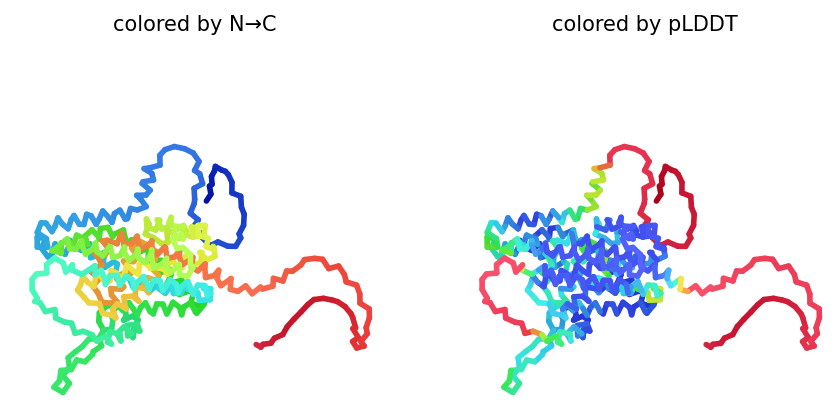

2023-11-09 07:09:30,261 alphafold2_ptm_model_3_seed_012 recycle=0 pLDDT=72.9 pTM=0.627
2023-11-09 07:09:40,342 alphafold2_ptm_model_3_seed_012 recycle=1 pLDDT=77.6 pTM=0.757 tol=3.46
2023-11-09 07:09:50,420 alphafold2_ptm_model_3_seed_012 recycle=2 pLDDT=78.3 pTM=0.766 tol=1.91
2023-11-09 07:10:00,534 alphafold2_ptm_model_3_seed_012 recycle=3 pLDDT=79.1 pTM=0.773 tol=1.42
2023-11-09 07:10:00,535 alphafold2_ptm_model_3_seed_012 took 40.3s (3 recycles)


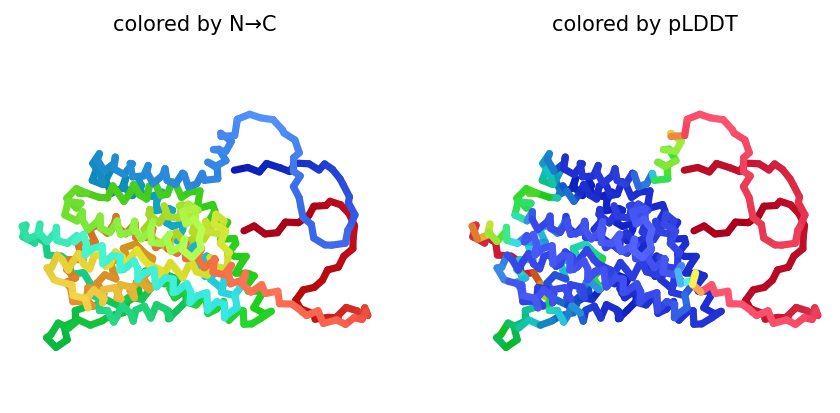

2023-11-09 07:10:11,141 alphafold2_ptm_model_4_seed_012 recycle=0 pLDDT=72.9 pTM=0.697
2023-11-09 07:10:21,179 alphafold2_ptm_model_4_seed_012 recycle=1 pLDDT=75.4 pTM=0.747 tol=3.47
2023-11-09 07:10:31,221 alphafold2_ptm_model_4_seed_012 recycle=2 pLDDT=75.5 pTM=0.751 tol=1.8
2023-11-09 07:10:41,298 alphafold2_ptm_model_4_seed_012 recycle=3 pLDDT=76.2 pTM=0.755 tol=1.71
2023-11-09 07:10:41,300 alphafold2_ptm_model_4_seed_012 took 40.2s (3 recycles)


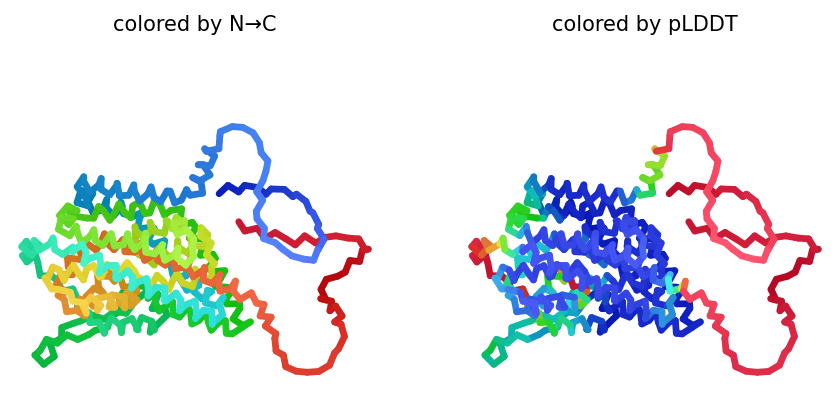

2023-11-09 07:10:51,973 alphafold2_ptm_model_5_seed_012 recycle=0 pLDDT=74.8 pTM=0.735
2023-11-09 07:11:02,079 alphafold2_ptm_model_5_seed_012 recycle=1 pLDDT=77.1 pTM=0.767 tol=4.18
2023-11-09 07:11:12,177 alphafold2_ptm_model_5_seed_012 recycle=2 pLDDT=76.6 pTM=0.758 tol=2.67
2023-11-09 07:11:22,314 alphafold2_ptm_model_5_seed_012 recycle=3 pLDDT=77.3 pTM=0.767 tol=2.55
2023-11-09 07:11:22,315 alphafold2_ptm_model_5_seed_012 took 40.4s (3 recycles)


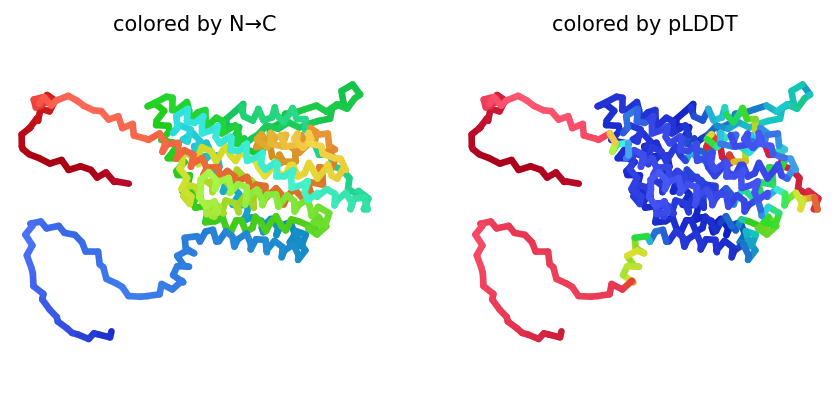

2023-11-09 07:11:37,852 alphafold2_ptm_model_1_seed_013 recycle=0 pLDDT=69.8 pTM=0.62
2023-11-09 07:11:47,870 alphafold2_ptm_model_1_seed_013 recycle=1 pLDDT=74.9 pTM=0.713 tol=7.05
2023-11-09 07:11:57,882 alphafold2_ptm_model_1_seed_013 recycle=2 pLDDT=75.1 pTM=0.732 tol=2.5
2023-11-09 07:12:07,900 alphafold2_ptm_model_1_seed_013 recycle=3 pLDDT=75.7 pTM=0.737 tol=2.06
2023-11-09 07:12:07,901 alphafold2_ptm_model_1_seed_013 took 40.1s (3 recycles)


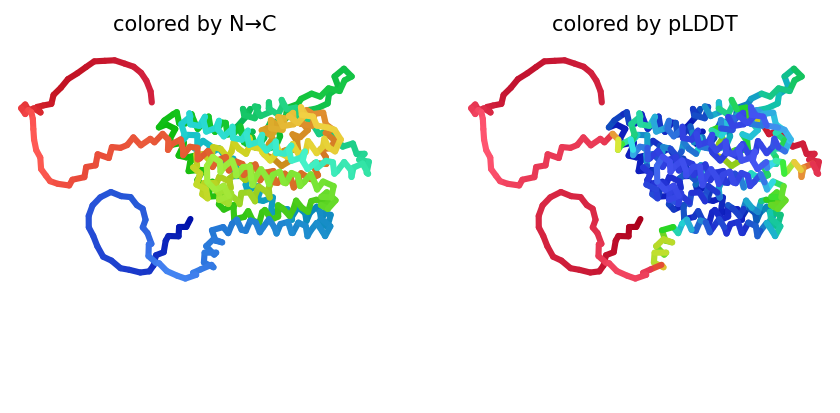

2023-11-09 07:12:18,515 alphafold2_ptm_model_2_seed_013 recycle=0 pLDDT=70.2 pTM=0.624
2023-11-09 07:12:28,558 alphafold2_ptm_model_2_seed_013 recycle=1 pLDDT=73.2 pTM=0.695 tol=5.48
2023-11-09 07:12:38,605 alphafold2_ptm_model_2_seed_013 recycle=2 pLDDT=74.6 pTM=0.729 tol=3.51
2023-11-09 07:12:48,646 alphafold2_ptm_model_2_seed_013 recycle=3 pLDDT=75.1 pTM=0.73 tol=1.41
2023-11-09 07:12:48,647 alphafold2_ptm_model_2_seed_013 took 40.2s (3 recycles)


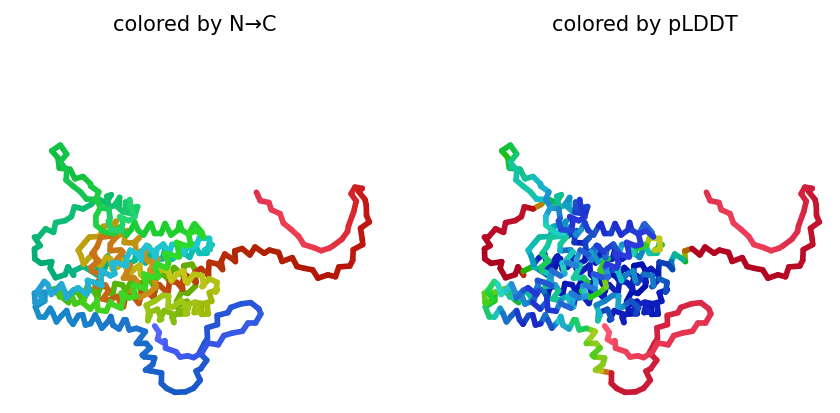

2023-11-09 07:12:59,304 alphafold2_ptm_model_3_seed_013 recycle=0 pLDDT=76.2 pTM=0.74
2023-11-09 07:13:09,391 alphafold2_ptm_model_3_seed_013 recycle=1 pLDDT=78.1 pTM=0.772 tol=3.21
2023-11-09 07:13:19,476 alphafold2_ptm_model_3_seed_013 recycle=2 pLDDT=77.9 pTM=0.771 tol=2.05
2023-11-09 07:13:29,569 alphafold2_ptm_model_3_seed_013 recycle=3 pLDDT=78.1 pTM=0.775 tol=1.63
2023-11-09 07:13:29,571 alphafold2_ptm_model_3_seed_013 took 40.3s (3 recycles)


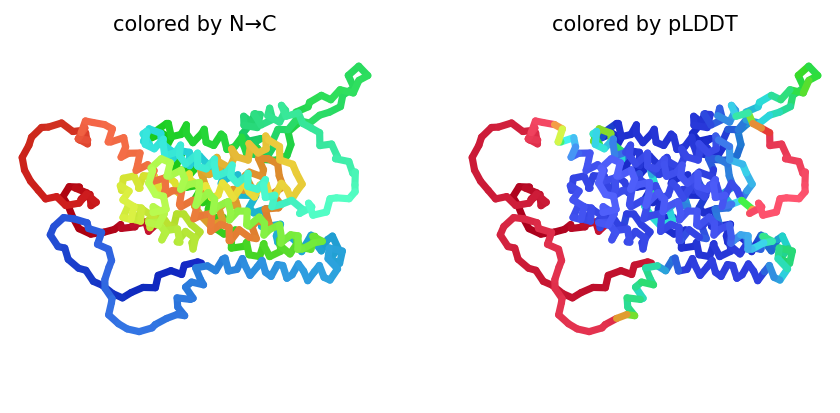

2023-11-09 07:13:40,250 alphafold2_ptm_model_4_seed_013 recycle=0 pLDDT=71.2 pTM=0.668
2023-11-09 07:13:50,298 alphafold2_ptm_model_4_seed_013 recycle=1 pLDDT=75.3 pTM=0.745 tol=3.16
2023-11-09 07:14:00,352 alphafold2_ptm_model_4_seed_013 recycle=2 pLDDT=75.7 pTM=0.75 tol=2.38
2023-11-09 07:14:10,396 alphafold2_ptm_model_4_seed_013 recycle=3 pLDDT=75.6 pTM=0.751 tol=0.877
2023-11-09 07:14:10,398 alphafold2_ptm_model_4_seed_013 took 40.2s (3 recycles)


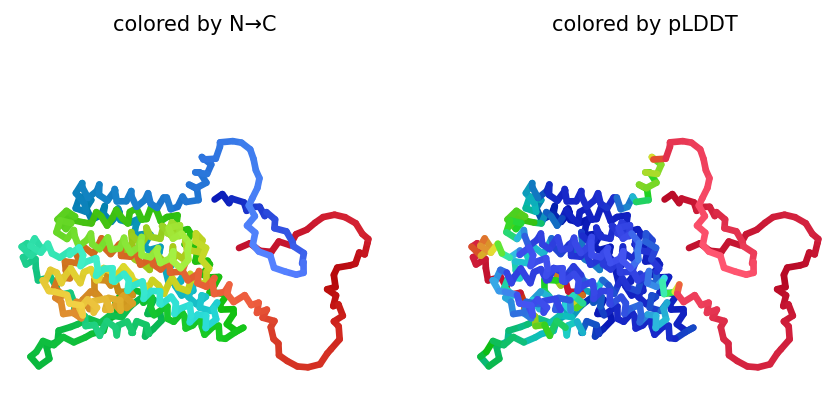

2023-11-09 07:14:21,046 alphafold2_ptm_model_5_seed_013 recycle=0 pLDDT=73.2 pTM=0.719
2023-11-09 07:14:31,179 alphafold2_ptm_model_5_seed_013 recycle=1 pLDDT=77.8 pTM=0.773 tol=5.64
2023-11-09 07:14:41,286 alphafold2_ptm_model_5_seed_013 recycle=2 pLDDT=77.4 pTM=0.766 tol=3.14
2023-11-09 07:14:51,412 alphafold2_ptm_model_5_seed_013 recycle=3 pLDDT=77.8 pTM=0.772 tol=2.5
2023-11-09 07:14:51,414 alphafold2_ptm_model_5_seed_013 took 40.4s (3 recycles)


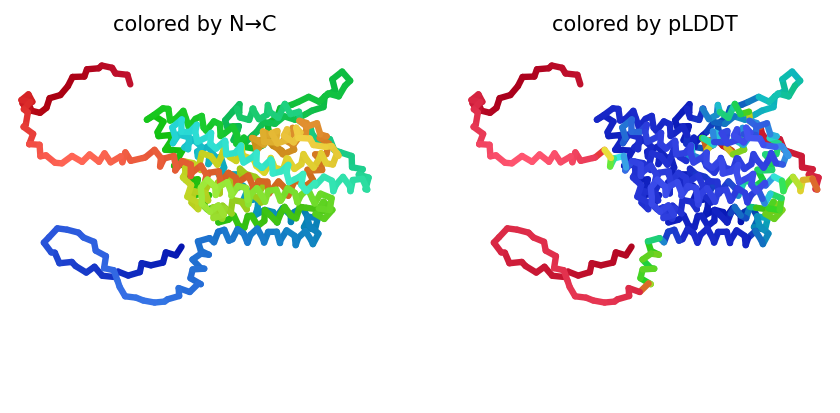

2023-11-09 07:15:06,467 alphafold2_ptm_model_1_seed_014 recycle=0 pLDDT=69.7 pTM=0.629
2023-11-09 07:15:16,344 alphafold2_ptm_model_1_seed_014 recycle=1 pLDDT=74.6 pTM=0.708 tol=4.84
2023-11-09 07:15:26,226 alphafold2_ptm_model_1_seed_014 recycle=2 pLDDT=75.1 pTM=0.737 tol=2.69
2023-11-09 07:15:36,112 alphafold2_ptm_model_1_seed_014 recycle=3 pLDDT=75.2 pTM=0.729 tol=2.1
2023-11-09 07:15:36,113 alphafold2_ptm_model_1_seed_014 took 39.5s (3 recycles)


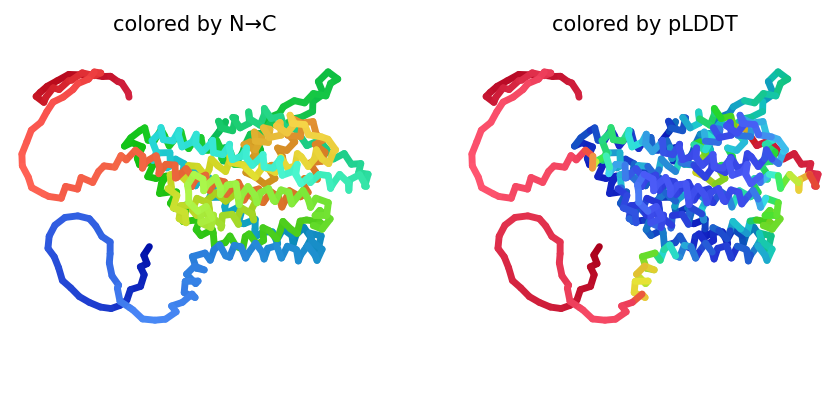

2023-11-09 07:15:46,928 alphafold2_ptm_model_2_seed_014 recycle=0 pLDDT=71.4 pTM=0.645
2023-11-09 07:15:56,866 alphafold2_ptm_model_2_seed_014 recycle=1 pLDDT=76.9 pTM=0.753 tol=3.21
2023-11-09 07:16:06,801 alphafold2_ptm_model_2_seed_014 recycle=2 pLDDT=76.5 pTM=0.752 tol=1.77
2023-11-09 07:16:16,725 alphafold2_ptm_model_2_seed_014 recycle=3 pLDDT=76.4 pTM=0.75 tol=1.28
2023-11-09 07:16:16,726 alphafold2_ptm_model_2_seed_014 took 39.7s (3 recycles)


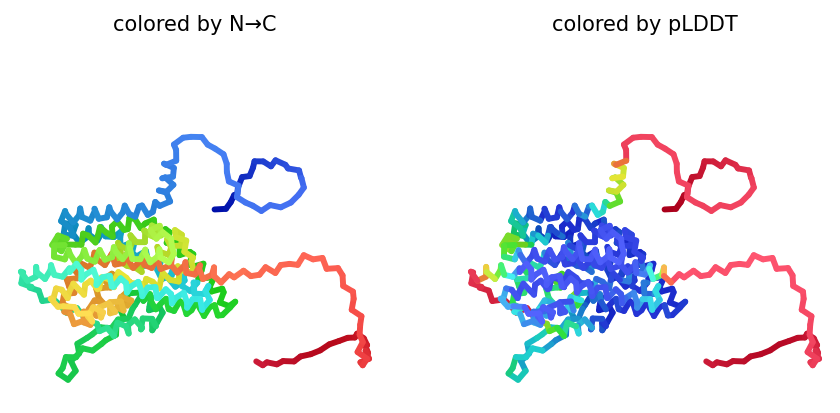

2023-11-09 07:16:27,226 alphafold2_ptm_model_3_seed_014 recycle=0 pLDDT=74.3 pTM=0.709
2023-11-09 07:16:37,168 alphafold2_ptm_model_3_seed_014 recycle=1 pLDDT=77.2 pTM=0.758 tol=4.14
2023-11-09 07:16:47,111 alphafold2_ptm_model_3_seed_014 recycle=2 pLDDT=77.6 pTM=0.764 tol=1.5
2023-11-09 07:16:57,075 alphafold2_ptm_model_3_seed_014 recycle=3 pLDDT=78.2 pTM=0.772 tol=1.37
2023-11-09 07:16:57,076 alphafold2_ptm_model_3_seed_014 took 39.8s (3 recycles)


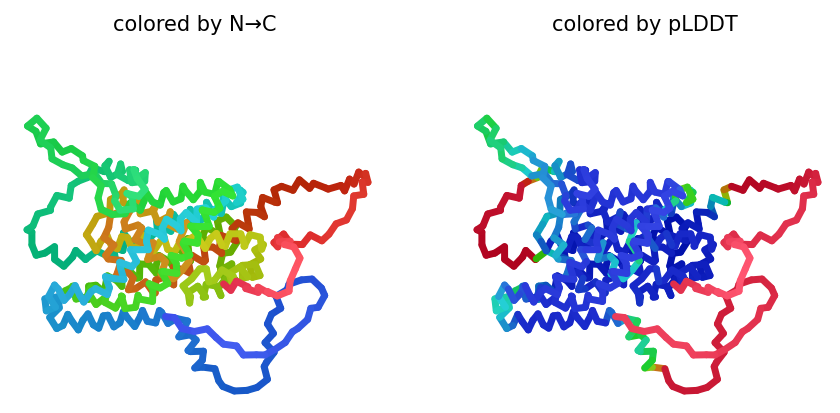

2023-11-09 07:17:07,593 alphafold2_ptm_model_4_seed_014 recycle=0 pLDDT=72.9 pTM=0.691
2023-11-09 07:17:17,517 alphafold2_ptm_model_4_seed_014 recycle=1 pLDDT=75.4 pTM=0.751 tol=2.82
2023-11-09 07:17:27,430 alphafold2_ptm_model_4_seed_014 recycle=2 pLDDT=75.4 pTM=0.747 tol=2.08
2023-11-09 07:17:37,347 alphafold2_ptm_model_4_seed_014 recycle=3 pLDDT=75.4 pTM=0.75 tol=1.02
2023-11-09 07:17:37,349 alphafold2_ptm_model_4_seed_014 took 39.7s (3 recycles)


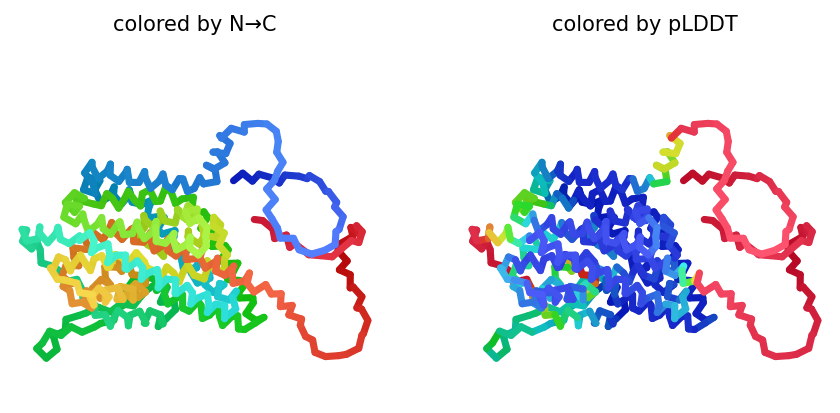

2023-11-09 07:17:47,889 alphafold2_ptm_model_5_seed_014 recycle=0 pLDDT=74.4 pTM=0.731
2023-11-09 07:17:57,910 alphafold2_ptm_model_5_seed_014 recycle=1 pLDDT=78.2 pTM=0.781 tol=3.61
2023-11-09 07:18:07,891 alphafold2_ptm_model_5_seed_014 recycle=2 pLDDT=77.3 pTM=0.769 tol=3.59
2023-11-09 07:18:17,878 alphafold2_ptm_model_5_seed_014 recycle=3 pLDDT=77.1 pTM=0.768 tol=3.4
2023-11-09 07:18:17,880 alphafold2_ptm_model_5_seed_014 took 39.9s (3 recycles)


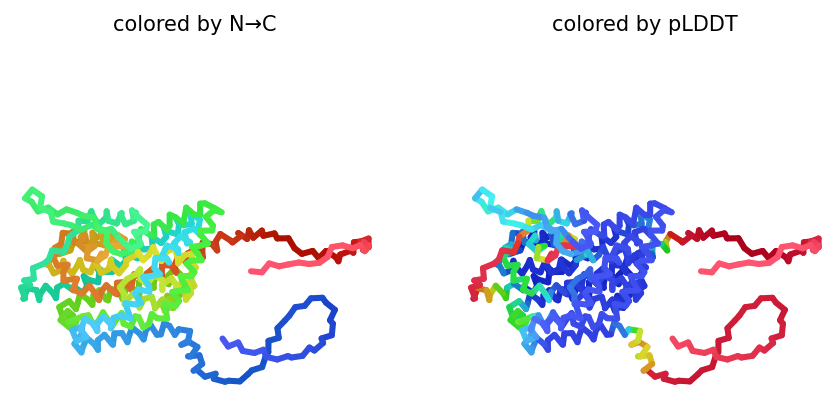

2023-11-09 07:18:32,349 alphafold2_ptm_model_1_seed_015 recycle=0 pLDDT=70 pTM=0.638
2023-11-09 07:18:42,209 alphafold2_ptm_model_1_seed_015 recycle=1 pLDDT=72.2 pTM=0.683 tol=4.36
2023-11-09 07:18:52,090 alphafold2_ptm_model_1_seed_015 recycle=2 pLDDT=74.2 pTM=0.723 tol=3.22
2023-11-09 07:19:01,957 alphafold2_ptm_model_1_seed_015 recycle=3 pLDDT=73.2 pTM=0.7 tol=2.2
2023-11-09 07:19:01,959 alphafold2_ptm_model_1_seed_015 took 39.5s (3 recycles)


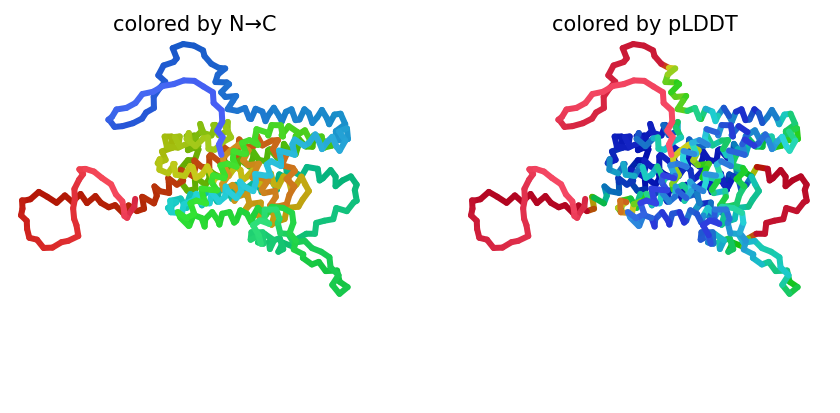

2023-11-09 07:19:12,456 alphafold2_ptm_model_2_seed_015 recycle=0 pLDDT=70.1 pTM=0.63
2023-11-09 07:19:22,370 alphafold2_ptm_model_2_seed_015 recycle=1 pLDDT=74.5 pTM=0.719 tol=5.48
2023-11-09 07:19:32,284 alphafold2_ptm_model_2_seed_015 recycle=2 pLDDT=75.4 pTM=0.737 tol=2.75
2023-11-09 07:19:42,193 alphafold2_ptm_model_2_seed_015 recycle=3 pLDDT=74.8 pTM=0.725 tol=1.72
2023-11-09 07:19:42,194 alphafold2_ptm_model_2_seed_015 took 39.7s (3 recycles)


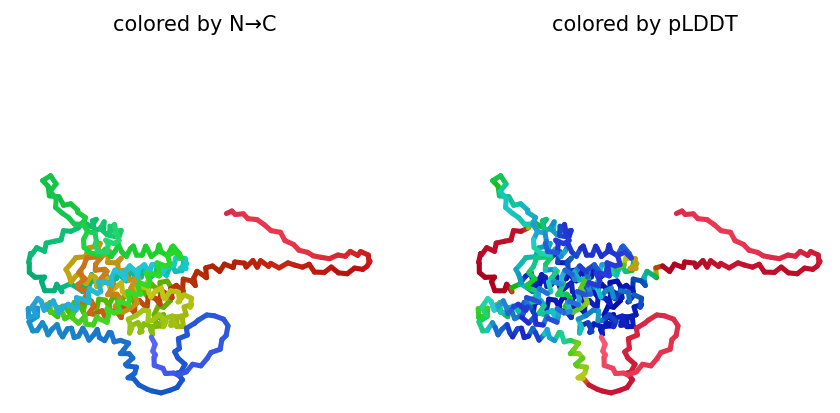

2023-11-09 07:19:52,693 alphafold2_ptm_model_3_seed_015 recycle=0 pLDDT=74.2 pTM=0.707
2023-11-09 07:20:02,644 alphafold2_ptm_model_3_seed_015 recycle=1 pLDDT=77.8 pTM=0.768 tol=4.75
2023-11-09 07:20:12,602 alphafold2_ptm_model_3_seed_015 recycle=2 pLDDT=78.4 pTM=0.775 tol=1.57
2023-11-09 07:20:22,557 alphafold2_ptm_model_3_seed_015 recycle=3 pLDDT=78.1 pTM=0.771 tol=1.08
2023-11-09 07:20:22,559 alphafold2_ptm_model_3_seed_015 took 39.8s (3 recycles)


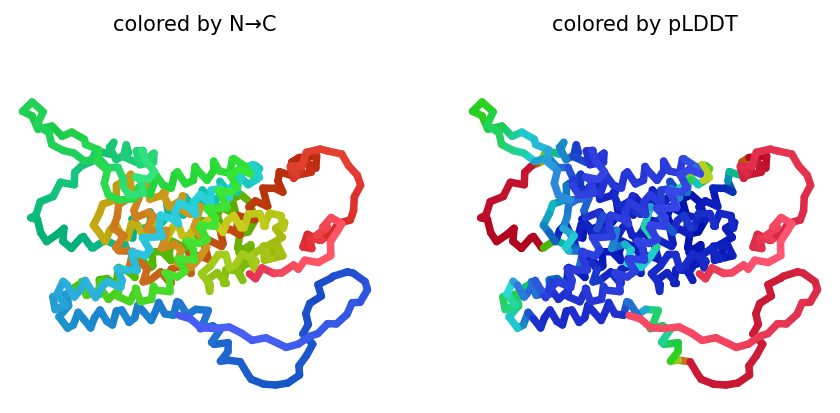

2023-11-09 07:20:33,067 alphafold2_ptm_model_4_seed_015 recycle=0 pLDDT=70.1 pTM=0.651
2023-11-09 07:20:43,005 alphafold2_ptm_model_4_seed_015 recycle=1 pLDDT=76.1 pTM=0.754 tol=3.65
2023-11-09 07:20:52,924 alphafold2_ptm_model_4_seed_015 recycle=2 pLDDT=75.7 pTM=0.749 tol=1.88
2023-11-09 07:21:02,831 alphafold2_ptm_model_4_seed_015 recycle=3 pLDDT=74.9 pTM=0.742 tol=1.41
2023-11-09 07:21:02,832 alphafold2_ptm_model_4_seed_015 took 39.7s (3 recycles)


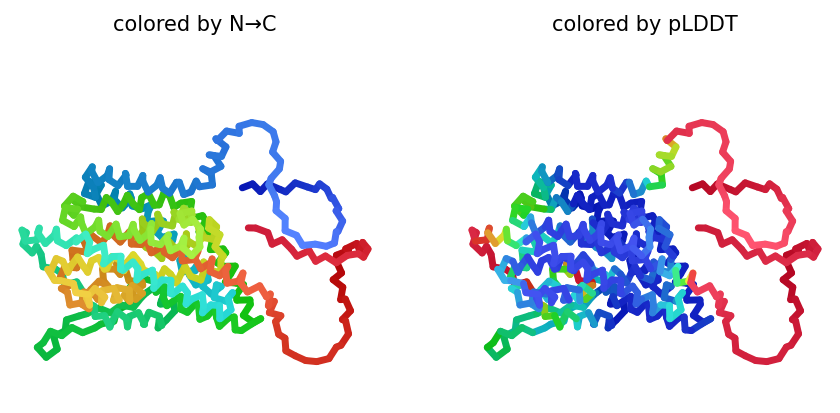

2023-11-09 07:21:13,328 alphafold2_ptm_model_5_seed_015 recycle=0 pLDDT=72.6 pTM=0.702
2023-11-09 07:21:23,320 alphafold2_ptm_model_5_seed_015 recycle=1 pLDDT=77.6 pTM=0.772 tol=2.97
2023-11-09 07:21:33,304 alphafold2_ptm_model_5_seed_015 recycle=2 pLDDT=77.4 pTM=0.768 tol=3.08
2023-11-09 07:21:43,287 alphafold2_ptm_model_5_seed_015 recycle=3 pLDDT=76.8 pTM=0.763 tol=0.971
2023-11-09 07:21:43,288 alphafold2_ptm_model_5_seed_015 took 39.9s (3 recycles)


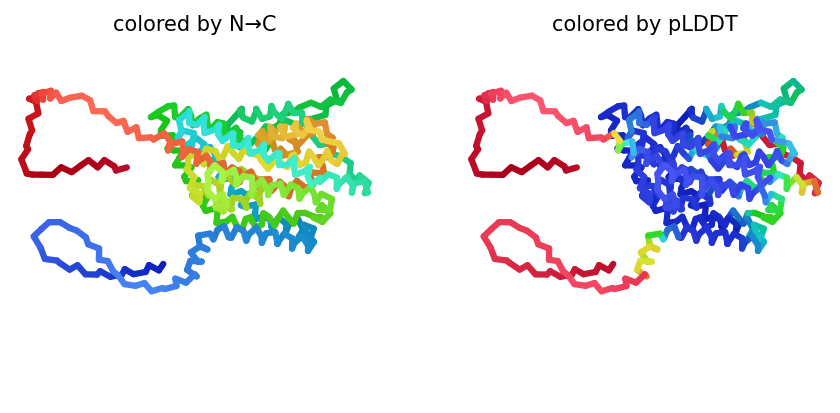

2023-11-09 07:21:43,871 reranking models by 'plddt' metric
2023-11-09 07:21:43,872 rank_001_alphafold2_ptm_model_3_seed_012 pLDDT=79.1 pTM=0.773
2023-11-09 07:21:43,872 rank_002_alphafold2_ptm_model_3_seed_011 pLDDT=78.4 pTM=0.775
2023-11-09 07:21:43,873 rank_003_alphafold2_ptm_model_3_seed_009 pLDDT=78.2 pTM=0.774
2023-11-09 07:21:43,873 rank_004_alphafold2_ptm_model_3_seed_001 pLDDT=78.2 pTM=0.771
2023-11-09 07:21:43,873 rank_005_alphafold2_ptm_model_3_seed_010 pLDDT=78.2 pTM=0.773
2023-11-09 07:21:43,874 rank_006_alphafold2_ptm_model_3_seed_004 pLDDT=78.2 pTM=0.77
2023-11-09 07:21:43,874 rank_007_alphafold2_ptm_model_3_seed_014 pLDDT=78.2 pTM=0.772
2023-11-09 07:21:43,875 rank_008_alphafold2_ptm_model_3_seed_015 pLDDT=78.1 pTM=0.771
2023-11-09 07:21:43,875 rank_009_alphafold2_ptm_model_3_seed_013 pLDDT=78.1 pTM=0.775
2023-11-09 07:21:43,876 rank_010_alphafold2_ptm_model_3_seed_007 pLDDT=77.9 pTM=0.772
2023-11-09 07:21:43,876 rank_011_alphafold2_ptm_model_3_seed_003 pLDDT=77.8 pTM=0.

0

In [ ]:
#@title Run Prediction
display_images = True #@param {type:"boolean"}

import sys
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
from Bio import BiopythonDeprecationWarning
warnings.simplefilter(action='ignore', category=BiopythonDeprecationWarning)
from pathlib import Path
from colabfold.download import download_alphafold_params, default_data_dir
from colabfold.utils import setup_logging
from colabfold.batch import get_queries, run, set_model_type
from colabfold.plot import plot_msa_v2

import os
import numpy as np
try:
  K80_chk = os.popen('nvidia-smi | grep "Tesla K80" | wc -l').read()
except:
  K80_chk = "0"
  pass
if "1" in K80_chk:
  print("WARNING: found GPU Tesla K80: limited to total length < 1000")
  if "TF_FORCE_UNIFIED_MEMORY" in os.environ:
    del os.environ["TF_FORCE_UNIFIED_MEMORY"]
  if "XLA_PYTHON_CLIENT_MEM_FRACTION" in os.environ:
    del os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"]

from colabfold.colabfold import plot_protein
from pathlib import Path
import matplotlib.pyplot as plt

# For some reason we need that to get pdbfixer to import
if use_amber and f"/usr/local/lib/python{python_version}/site-packages/" not in sys.path:
    sys.path.insert(0, f"/usr/local/lib/python{python_version}/site-packages/")

def input_features_callback(input_features):
  if display_images:
    plot_msa_v2(input_features)
    plt.show()
    plt.close()

def prediction_callback(protein_obj, length,
                        prediction_result, input_features, mode):
  model_name, relaxed = mode
  if not relaxed:
    if display_images:
      fig = plot_protein(protein_obj, Ls=length, dpi=150)
      plt.show()
      plt.close()

result_dir = jobname
log_filename = os.path.join(jobname,"log.txt")
if not os.path.isfile(log_filename) or 'logging_setup' not in globals():
  setup_logging(Path(log_filename))
  logging_setup = True

queries, is_complex = get_queries(queries_path)
model_type = set_model_type(is_complex, model_type)

if "multimer" in model_type and max_msa is not None:
  use_cluster_profile = False
else:
  use_cluster_profile = True

download_alphafold_params(model_type, Path("."))
results = run(
    queries=queries,
    result_dir=result_dir,
    use_templates=use_templates,
    custom_template_path=custom_template_path,
    num_relax=num_relax,
    msa_mode=msa_mode,
    model_type=model_type,
    num_models=5,
    num_recycles=num_recycles,
    relax_max_iterations=relax_max_iterations,
    recycle_early_stop_tolerance=recycle_early_stop_tolerance,
    num_seeds=num_seeds,
    use_dropout=use_dropout,
    model_order=[1,2,3,4,5],
    is_complex=is_complex,
    data_dir=Path("."),
    keep_existing_results=False,
    rank_by="auto",
    pair_mode=pair_mode,
    pairing_strategy=pairing_strategy,
    stop_at_score=float(100),
    prediction_callback=prediction_callback,
    dpi=dpi,
    zip_results=False,
    save_all=save_all,
    max_msa=max_msa,
    use_cluster_profile=use_cluster_profile,
    input_features_callback=input_features_callback,
    save_recycles=save_recycles,
    user_agent="colabfold/google-colab-main",
)
results_zip = f"{jobname}.result.zip"
os.system(f"zip -r {results_zip} {jobname}")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

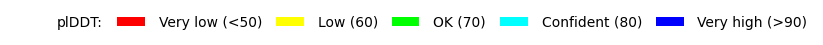

In [ ]:
#@title Display 3D structure {run: "auto"}
import py3Dmol
import glob
import matplotlib.pyplot as plt
from colabfold.colabfold import plot_plddt_legend
from colabfold.colabfold import pymol_color_list, alphabet_list
rank_num = 1 #@param ["1", "2", "3", "4", "5"] {type:"raw"}
color = "lDDT" #@param ["chain", "lDDT", "rainbow"]
show_sidechains = False #@param {type:"boolean"}
show_mainchains = False #@param {type:"boolean"}

tag = results["rank"][0][rank_num - 1]
jobname_prefix = ".custom" if msa_mode == "custom" else ""
pdb_filename = f"{jobname}/{jobname}{jobname_prefix}_unrelaxed_{tag}.pdb"
pdb_file = glob.glob(pdb_filename)

def show_pdb(rank_num=1, show_sidechains=False, show_mainchains=False, color="lDDT"):
  model_name = f"rank_{rank_num}"
  view = py3Dmol.view(js='https://3dmol.org/build/3Dmol.js',)
  view.addModel(open(pdb_file[0],'r').read(),'pdb')

  if color == "lDDT":
    view.setStyle({'cartoon': {'colorscheme': {'prop':'b','gradient': 'roygb','min':50,'max':90}}})
  elif color == "rainbow":
    view.setStyle({'cartoon': {'color':'spectrum'}})
  elif color == "chain":
    chains = len(queries[0][1]) + 1 if is_complex else 1
    for n,chain,color in zip(range(chains),alphabet_list,pymol_color_list):
       view.setStyle({'chain':chain},{'cartoon': {'color':color}})

  if show_sidechains:
    BB = ['C','O','N']
    view.addStyle({'and':[{'resn':["GLY","PRO"],'invert':True},{'atom':BB,'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
    view.addStyle({'and':[{'resn':"GLY"},{'atom':'CA'}]},
                        {'sphere':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
    view.addStyle({'and':[{'resn':"PRO"},{'atom':['C','O'],'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
  if show_mainchains:
    BB = ['C','O','N','CA']
    view.addStyle({'atom':BB},{'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})

  view.zoomTo()
  return view

show_pdb(rank_num, show_sidechains, show_mainchains, color).show()
if color == "lDDT":
  plot_plddt_legend().show()


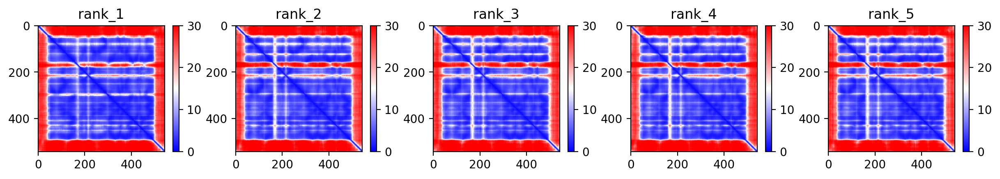
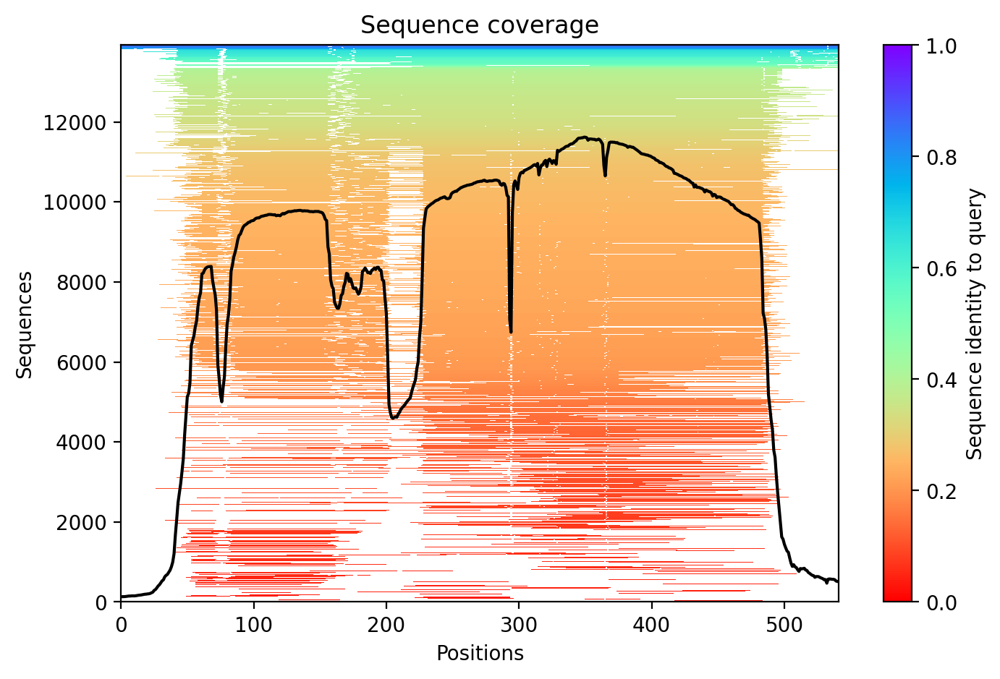
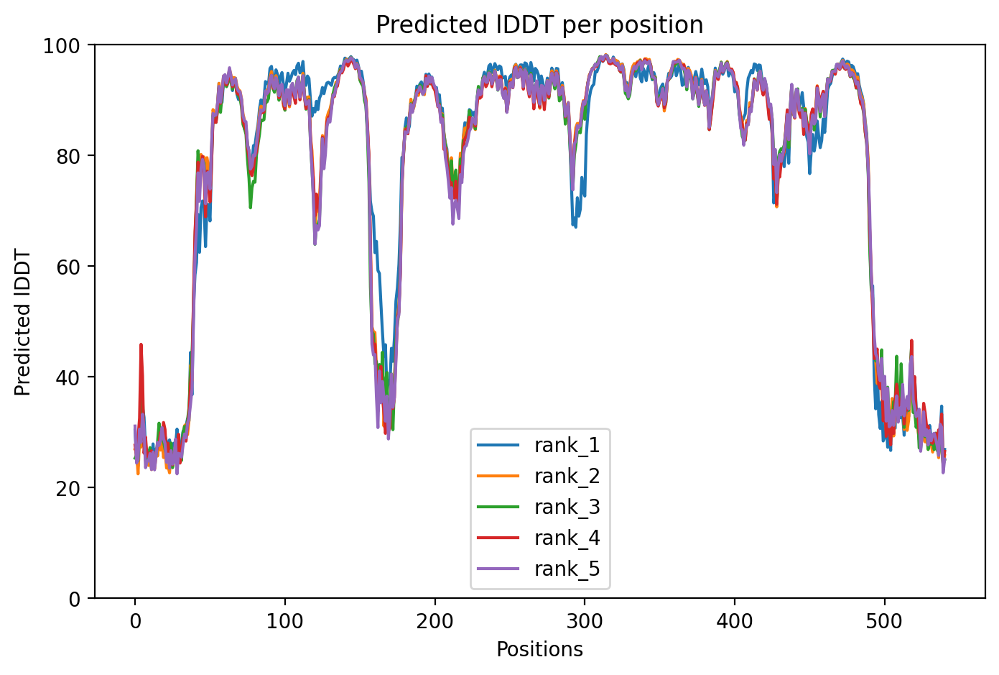

In [ ]:
#@title Plots {run: "auto"}
from IPython.display import display, HTML
import base64
from html import escape

# see: https://stackoverflow.com/a/53688522
def image_to_data_url(filename):
  ext = filename.split('.')[-1]
  prefix = f'data:image/{ext};base64,'
  with open(filename, 'rb') as f:
    img = f.read()
  return prefix + base64.b64encode(img).decode('utf-8')

pae = image_to_data_url(os.path.join(jobname,f"{jobname}{jobname_prefix}_pae.png"))
cov = image_to_data_url(os.path.join(jobname,f"{jobname}{jobname_prefix}_coverage.png"))
plddt = image_to_data_url(os.path.join(jobname,f"{jobname}{jobname_prefix}_plddt.png"))
display(HTML(f"""
<style>
  img {{
    float:left;
  }}
  .full {{
    max-width:100%;
  }}
  .half {{
    max-width:50%;
  }}
  @media (max-width:640px) {{
    .half {{
      max-width:100%;
    }}
  }}
</style>
<div style="max-width:90%; padding:2em;">
  <h1>Plots for {escape(jobname)}</h1>
  <img src="{pae}" class="full" />
  <img src="{cov}" class="half" />
  <img src="{plddt}" class="half" />
</div>
"""))


In [ ]:
#@title Package and download results
#@markdown If you are having issues downloading the result archive, try disabling your adblocker and run this cell again. If that fails click on the little folder icon to the left, navigate to file: `jobname.result.zip`, right-click and select \"Download\" (see [screenshot](https://pbs.twimg.com/media/E6wRW2lWUAEOuoe?format=jpg&name=small)).

if msa_mode == "custom":
  print("Don't forget to cite your custom MSA generation method.")

files.download(f"{jobname}.result.zip")

if save_to_google_drive == True and drive:
  uploaded = drive.CreateFile({'title': f"{jobname}.result.zip"})
  uploaded.SetContentFile(f"{jobname}.result.zip")
  uploaded.Upload()
  print(f"Uploaded {jobname}.result.zip to Google Drive with ID {uploaded.get('id')}")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Instructions <a name="Instructions"></a>
**Quick start**
1. Paste your protein sequence(s) in the input field.
2. Press "Runtime" -> "Run all".
3. The pipeline consists of 5 steps. The currently running step is indicated by a circle with a stop sign next to it.

**Result zip file contents**

1. PDB formatted structures sorted by avg. pLDDT and complexes are sorted by pTMscore. (unrelaxed and relaxed if `use_amber` is enabled).
2. Plots of the model quality.
3. Plots of the MSA coverage.
4. Parameter log file.
5. A3M formatted input MSA.
6. A `predicted_aligned_error_v1.json` using [AlphaFold-DB's format](https://alphafold.ebi.ac.uk/faq#faq-7) and a `scores.json` for each model which contains an array (list of lists) for PAE, a list with the average pLDDT and the pTMscore.
7. BibTeX file with citations for all used tools and databases.

At the end of the job a download modal box will pop up with a `jobname.result.zip` file. Additionally, if the `save_to_google_drive` option was selected, the `jobname.result.zip` will be uploaded to your Google Drive.

**MSA generation for complexes**

For the complex prediction we use unpaired and paired MSAs. Unpaired MSA is generated the same way as for the protein structures prediction by searching the UniRef100 and environmental sequences three iterations each.

The paired MSA is generated by searching the UniRef100 database and pairing the best hits sharing the same NCBI taxonomic identifier (=species or sub-species). We only pair sequences if all of the query sequences are present for the respective taxonomic identifier.

**Using a custom MSA as input**

To predict the structure with a custom MSA (A3M formatted): (1) Change the `msa_mode`: to "custom", (2) Wait for an upload box to appear at the end of the "MSA options ..." box. Upload your A3M. The first fasta entry of the A3M must be the query sequence without gaps.

It is also possilbe to proide custom MSAs for complex predictions. Read more about the format [here](https://github.com/sokrypton/ColabFold/issues/76).

As an alternative for MSA generation the [HHblits Toolkit server](https://toolkit.tuebingen.mpg.de/tools/hhblits) can be used. After submitting your query, click "Query Template MSA" -> "Download Full A3M". Download the A3M file and upload it in this notebook.

**PDB100** <a name="pdb100"></a>

As of 23/06/08, we have transitioned from using the PDB70 to a 100% clustered PDB, the PDB100. The construction methodology of PDB100 differs from that of PDB70.

The PDB70 was constructed by running each PDB70 representative sequence through [HHblits](https://github.com/soedinglab/hh-suite) against the [Uniclust30](https://uniclust.mmseqs.com/). On the other hand, the PDB100 is built by searching each PDB100 representative structure with [Foldseek](https://github.com/steineggerlab/foldseek) against the [AlphaFold Database](https://alphafold.ebi.ac.uk).

To maintain compatibility with older Notebook versions and local installations, the generated files and API responses will continue to be named "PDB70", even though we're now using the PDB100.

**Using custom templates** <a name="custom_templates"></a>

To predict the structure with a custom template (PDB or mmCIF formatted): (1) change the `template_mode` to "custom" in the execute cell and (2) wait for an upload box to appear at the end of the "Input Protein" box. Select and upload your templates (multiple choices are possible).

* Templates must follow the four letter PDB naming with lower case letters.

* Templates in mmCIF format must contain `_entity_poly_seq`. An error is thrown if this field is not present. The field `_pdbx_audit_revision_history.revision_date` is automatically generated if it is not present.

* Templates in PDB format are automatically converted to the mmCIF format. `_entity_poly_seq` and `_pdbx_audit_revision_history.revision_date` are automatically generated.

If you encounter problems, please report them to this [issue](https://github.com/sokrypton/ColabFold/issues/177).

**Comparison to the full AlphaFold2 and AlphaFold2 Colab**

This notebook replaces the homology detection and MSA pairing of AlphaFold2 with MMseqs2. For a comparison against the [AlphaFold2 Colab](https://colab.research.google.com/github/deepmind/alphafold/blob/main/notebooks/AlphaFold.ipynb) and the full [AlphaFold2](https://github.com/deepmind/alphafold) system read our [paper](https://www.nature.com/articles/s41592-022-01488-1).

**Troubleshooting**
* Check that the runtime type is set to GPU at "Runtime" -> "Change runtime type".
* Try to restart the session "Runtime" -> "Factory reset runtime".
* Check your input sequence.

**Known issues**
* Google Colab assigns different types of GPUs with varying amount of memory. Some might not have enough memory to predict the structure for a long sequence.
* Your browser can block the pop-up for downloading the result file. You can choose the `save_to_google_drive` option to upload to Google Drive instead or manually download the result file: Click on the little folder icon to the left, navigate to file: `jobname.result.zip`, right-click and select \"Download\" (see [screenshot](https://pbs.twimg.com/media/E6wRW2lWUAEOuoe?format=jpg&name=small)).

**Limitations**
* Computing resources: Our MMseqs2 API can handle ~20-50k requests per day.
* MSAs: MMseqs2 is very precise and sensitive but might find less hits compared to HHblits/HMMer searched against BFD or MGnify.
* We recommend to additionally use the full [AlphaFold2 pipeline](https://github.com/deepmind/alphafold).

**Description of the plots**
*   **Number of sequences per position** - We want to see at least 30 sequences per position, for best performance, ideally 100 sequences.
*   **Predicted lDDT per position** - model confidence (out of 100) at each position. The higher the better.
*   **Predicted Alignment Error** - For homooligomers, this could be a useful metric to assess how confident the model is about the interface. The lower the better.

**Bugs**
- If you encounter any bugs, please report the issue to https://github.com/sokrypton/ColabFold/issues

**License**

The source code of ColabFold is licensed under [MIT](https://raw.githubusercontent.com/sokrypton/ColabFold/main/LICENSE). Additionally, this notebook uses the AlphaFold2 source code and its parameters licensed under [Apache 2.0](https://raw.githubusercontent.com/deepmind/alphafold/main/LICENSE) and [CC BY 4.0](https://creativecommons.org/licenses/by-sa/4.0/) respectively. Read more about the AlphaFold license [here](https://github.com/deepmind/alphafold).

**Acknowledgments**
- We thank the AlphaFold team for developing an excellent model and open sourcing the software.

- [KOBIC](https://kobic.re.kr) and [Söding Lab](https://www.mpinat.mpg.de/soeding) for providing the computational resources for the MMseqs2 MSA server.

- Richard Evans for helping to benchmark the ColabFold's Alphafold-multimer support.

- [David Koes](https://github.com/dkoes) for his awesome [py3Dmol](https://3dmol.csb.pitt.edu/) plugin, without whom these notebooks would be quite boring!

- Do-Yoon Kim for creating the ColabFold logo.

- A colab by Sergey Ovchinnikov ([@sokrypton](https://twitter.com/sokrypton)), Milot Mirdita ([@milot_mirdita](https://twitter.com/milot_mirdita)) and Martin Steinegger ([@thesteinegger](https://twitter.com/thesteinegger)).
